In [158]:
import matplotlib.pyplot as plt
import numpy as np
import math
def fa(x=1,y=1,**kwargs):
    fig,ax = plt.subplots(x,y,**kwargs)
    return fig,ax
%matplotlib notebook
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import datasets, layers, models, optimizers

from tqdm import tqdm
import time
import collections
import pandas as pd

# Linear Regression

## Single-parameter model

The following shows how to implement a simple linear regression model with TF Keras api. It also shows that how training and test losses are connected to each other.

The expected values of test loss is larger than train loss, but overall these distributions have rather wide standard deviations, meaning that is also rather usual to observe a larger training loss than test.

In [2]:
#generate some data that shows clear non-linearities.
def data_fun(N=1000,noise=.4):
    '''
    Generates data according to logit function (inverse of a sigmoidal function) with
    some Gaussian noise. Splits this to train and test sets.
    '''
    def logit_transform(p):
        return np.log(p/(1-p))
    x = np.random.rand(N)
    y = logit_transform(x) + np.random.randn(N)*noise
    x_train, x_test, y_train, y_test = train_test_split(x,y, 
                                                    test_size=0.25,
                                                    random_state=42)
    return x_train, x_test, y_train, y_test

def linear_model(activation='linear',units=1):
    OPTIMIZER = tf.keras.optimizers.SGD()#tf.keras.optimizers.Adam()
    model = tf.keras.models.Sequential()
    model.add(tf.keras.Input(shape=(1,)))
    
    model.add(tf.keras.layers.Dense(units, 
                                    activation=activation,
                                    kernel_initializer = tf.random_normal_initializer))
    model.add(tf.keras.layers.Dense(1))
    model.compile(optimizer=OPTIMIZER,loss='mse',metrics=[])
    return model

def plot_dataset(x,y,**kwargs):
    plt.scatter(x,y,alpha=0.3,marker='.',**kwargs)

def train_N_times(N,model,verbose = False):
    iter  = 0
    Res   = collections.defaultdict(list)
    for iter in range(N):
        x_train, x_test, y_train, y_test = data_fun()
        # Training the model.
        H = model.fit(x_train,y_train,
                  batch_size=100, 
                  epochs=1000,
                  verbose=verbose, 
                  validation_split=0.2)
        Res['loss'].append(H.history['loss'][-1])
        Res['val_loss'].append(H.history['val_loss'][-1])
        Res['test_loss'].append(model.evaluate(x_test, y_test, batch_size=200,verbose=False))
    df = pd.DataFrame.from_dict(Res)
    df['train-test'] = df['loss'] - df['val_loss']
    return df

In [4]:
x_train, x_test, y_train, y_test = data_fun()
activation = 'relu'
verbose = True
OPTIMIZER = tf.keras.optimizers.Adam(learning_rate=0.05)#tf.keras.optimizers.Adam()

model = tf.keras.models.Sequential()
model.add(tf.keras.Input(shape=(1,)))
model.add(tf.keras.layers.Dense(20, activation='relu'))
model.add(tf.keras.layers.Dense(1))

model.compile(optimizer=OPTIMIZER,loss='mse',metrics=[])

H = model.fit(x_train,y_train-np.mean(y_train),
          batch_size=100,
          epochs=5000,
          verbose=verbose,
          validation_split=0.1)

Epoch 1/5000
7/7 [==============================] - 0s 16ms/step - loss: 2.9949 - val_loss: 1.9023
Epoch 2/5000
7/7 [==============================] - 0s 3ms/step - loss: 1.4641 - val_loss: 0.6671
Epoch 3/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.6578 - val_loss: 0.8264
Epoch 4/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.7126 - val_loss: 0.6029
Epoch 5/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.5359 - val_loss: 0.5723
Epoch 6/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.5121 - val_loss: 0.4508
Epoch 7/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.4519 - val_loss: 0.4945
Epoch 8/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.4301 - val_loss: 0.5247
Epoch 9/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.4344 - val_loss: 0.4318
Epoch 10/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.4189 - val_loss: 0.4350
Epoch 11/5000
7/7 

Epoch 84/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.3349 - val_loss: 0.3546
Epoch 85/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.3296 - val_loss: 0.3533
Epoch 86/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.3137 - val_loss: 0.3668
Epoch 87/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.3138 - val_loss: 0.3522
Epoch 88/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.3152 - val_loss: 0.3573
Epoch 89/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.3176 - val_loss: 0.3420
Epoch 90/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.3237 - val_loss: 0.3556
Epoch 91/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.3144 - val_loss: 0.3790
Epoch 92/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.3266 - val_loss: 0.4153
Epoch 93/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.3223 - val_loss: 0.3482
Epoch 94/5

7/7 [==============================] - 0s 3ms/step - loss: 0.2522 - val_loss: 0.3467
Epoch 167/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2521 - val_loss: 0.3501
Epoch 168/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2835 - val_loss: 0.3744
Epoch 169/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.3221 - val_loss: 0.3019
Epoch 170/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2887 - val_loss: 0.4187
Epoch 171/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2808 - val_loss: 0.3065
Epoch 172/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2783 - val_loss: 0.3189
Epoch 173/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2507 - val_loss: 0.2878
Epoch 174/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2516 - val_loss: 0.2843
Epoch 175/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2600 - val_loss: 0.3936
Epoch 176/5000


7/7 [==============================] - 0s 3ms/step - loss: 0.2005 - val_loss: 0.2869
Epoch 249/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2013 - val_loss: 0.3042
Epoch 250/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1986 - val_loss: 0.2613
Epoch 251/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1995 - val_loss: 0.2414
Epoch 252/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2051 - val_loss: 0.2569
Epoch 253/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1969 - val_loss: 0.2486
Epoch 254/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1984 - val_loss: 0.2620
Epoch 255/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2086 - val_loss: 0.2503
Epoch 256/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2073 - val_loss: 0.2939
Epoch 257/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2792 - val_loss: 0.3967
Epoch 258/5000


7/7 [==============================] - 0s 3ms/step - loss: 0.2114 - val_loss: 0.3513
Epoch 331/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2157 - val_loss: 0.2466
Epoch 332/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1950 - val_loss: 0.2431
Epoch 333/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1974 - val_loss: 0.2570
Epoch 334/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1938 - val_loss: 0.2526
Epoch 335/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1931 - val_loss: 0.2600
Epoch 336/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1984 - val_loss: 0.2564
Epoch 337/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1951 - val_loss: 0.2723
Epoch 338/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1952 - val_loss: 0.2413
Epoch 339/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1995 - val_loss: 0.2507
Epoch 340/5000


7/7 [==============================] - 0s 3ms/step - loss: 0.2104 - val_loss: 0.3551
Epoch 413/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2117 - val_loss: 0.2996
Epoch 414/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2573 - val_loss: 0.2876
Epoch 415/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2257 - val_loss: 0.2939
Epoch 416/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2089 - val_loss: 0.4317
Epoch 417/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.2344 - val_loss: 0.2437
Epoch 418/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2311 - val_loss: 0.2945
Epoch 419/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2563 - val_loss: 0.2843
Epoch 420/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2024 - val_loss: 0.3162
Epoch 421/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2007 - val_loss: 0.2329
Epoch 422/5000


7/7 [==============================] - 0s 4ms/step - loss: 0.2037 - val_loss: 0.2614
Epoch 495/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1883 - val_loss: 0.2449
Epoch 496/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.2014 - val_loss: 0.2544
Epoch 497/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2177 - val_loss: 0.3592
Epoch 498/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2098 - val_loss: 0.2926
Epoch 499/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1990 - val_loss: 0.2347
Epoch 500/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1865 - val_loss: 0.2393
Epoch 501/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1814 - val_loss: 0.2826
Epoch 502/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1902 - val_loss: 0.2710
Epoch 503/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2006 - val_loss: 0.2321
Epoch 504/5000


7/7 [==============================] - 0s 4ms/step - loss: 0.1801 - val_loss: 0.2427
Epoch 577/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2086 - val_loss: 0.3529
Epoch 578/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2417 - val_loss: 0.2579
Epoch 579/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2929 - val_loss: 0.2841
Epoch 580/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2445 - val_loss: 0.4558
Epoch 581/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2557 - val_loss: 0.2450
Epoch 582/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2094 - val_loss: 0.2337
Epoch 583/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1937 - val_loss: 0.2647
Epoch 584/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1991 - val_loss: 0.2675
Epoch 585/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1859 - val_loss: 0.2630
Epoch 586/5000


7/7 [==============================] - 0s 3ms/step - loss: 0.2014 - val_loss: 0.2463
Epoch 659/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1972 - val_loss: 0.2821
Epoch 660/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1885 - val_loss: 0.2766
Epoch 661/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1899 - val_loss: 0.2320
Epoch 662/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1886 - val_loss: 0.2904
Epoch 663/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1994 - val_loss: 0.2680
Epoch 664/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1948 - val_loss: 0.2813
Epoch 665/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2177 - val_loss: 0.3113
Epoch 666/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1986 - val_loss: 0.3083
Epoch 667/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2157 - val_loss: 0.2679
Epoch 668/5000


7/7 [==============================] - 0s 3ms/step - loss: 0.2009 - val_loss: 0.2673
Epoch 741/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2135 - val_loss: 0.2550
Epoch 742/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.2011 - val_loss: 0.2458
Epoch 743/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2046 - val_loss: 0.2674
Epoch 744/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.2000 - val_loss: 0.2629
Epoch 745/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.2007 - val_loss: 0.2263
Epoch 746/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1825 - val_loss: 0.2407
Epoch 747/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1817 - val_loss: 0.2394
Epoch 748/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1809 - val_loss: 0.2392
Epoch 749/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1855 - val_loss: 0.2364
Epoch 750/5000


7/7 [==============================] - 0s 3ms/step - loss: 0.2737 - val_loss: 0.4696
Epoch 823/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.3669 - val_loss: 0.4367
Epoch 824/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.2911 - val_loss: 0.3241
Epoch 825/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2319 - val_loss: 0.2613
Epoch 826/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2050 - val_loss: 0.2797
Epoch 827/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2021 - val_loss: 0.2433
Epoch 828/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1828 - val_loss: 0.2315
Epoch 829/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1888 - val_loss: 0.2514
Epoch 830/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2041 - val_loss: 0.2786
Epoch 831/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2273 - val_loss: 0.3168
Epoch 832/5000


7/7 [==============================] - 0s 3ms/step - loss: 0.1830 - val_loss: 0.2412
Epoch 905/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1816 - val_loss: 0.2657
Epoch 906/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1898 - val_loss: 0.2542
Epoch 907/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1949 - val_loss: 0.2533
Epoch 908/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2074 - val_loss: 0.2405
Epoch 909/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2071 - val_loss: 0.2840
Epoch 910/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1916 - val_loss: 0.2596
Epoch 911/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1884 - val_loss: 0.2324
Epoch 912/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1986 - val_loss: 0.2756
Epoch 913/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2005 - val_loss: 0.2964
Epoch 914/5000


7/7 [==============================] - 0s 3ms/step - loss: 0.1907 - val_loss: 0.2274
Epoch 987/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1857 - val_loss: 0.2631
Epoch 988/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1870 - val_loss: 0.2546
Epoch 989/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1918 - val_loss: 0.2300
Epoch 990/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1870 - val_loss: 0.2265
Epoch 991/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1849 - val_loss: 0.2424
Epoch 992/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1969 - val_loss: 0.2921
Epoch 993/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2264 - val_loss: 0.2320
Epoch 994/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2195 - val_loss: 0.2645
Epoch 995/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.2161 - val_loss: 0.3111
Epoch 996/5000


7/7 [==============================] - 0s 4ms/step - loss: 0.2056 - val_loss: 0.2643
Epoch 1149/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1886 - val_loss: 0.2345
Epoch 1150/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1830 - val_loss: 0.2248
Epoch 1151/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1926 - val_loss: 0.2282
Epoch 1152/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1861 - val_loss: 0.2348
Epoch 1153/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1890 - val_loss: 0.2495
Epoch 1154/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1774 - val_loss: 0.2296
Epoch 1155/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1826 - val_loss: 0.2250
Epoch 1156/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1828 - val_loss: 0.2701
Epoch 1157/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1952 - val_loss: 0.2454
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1908 - val_loss: 0.2937
Epoch 1311/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2003 - val_loss: 0.2292
Epoch 1312/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1844 - val_loss: 0.2871
Epoch 1313/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2027 - val_loss: 0.2203
Epoch 1314/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2004 - val_loss: 0.2452
Epoch 1315/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1990 - val_loss: 0.2605
Epoch 1316/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1982 - val_loss: 0.2237
Epoch 1317/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1822 - val_loss: 0.2259
Epoch 1318/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1838 - val_loss: 0.2245
Epoch 1319/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1936 - val_loss: 0.2822
Epoch 

7/7 [==============================] - 0s 4ms/step - loss: 0.1992 - val_loss: 0.2262
Epoch 1473/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1789 - val_loss: 0.2524
Epoch 1474/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1938 - val_loss: 0.2488
Epoch 1475/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1871 - val_loss: 0.2497
Epoch 1476/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1822 - val_loss: 0.2351
Epoch 1477/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1806 - val_loss: 0.2198
Epoch 1478/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1972 - val_loss: 0.2201
Epoch 1479/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1855 - val_loss: 0.2241
Epoch 1480/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1813 - val_loss: 0.3315
Epoch 1481/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2044 - val_loss: 0.2172
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.2295 - val_loss: 0.3704
Epoch 1635/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2389 - val_loss: 0.2625
Epoch 1636/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2273 - val_loss: 0.3679
Epoch 1637/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2228 - val_loss: 0.2238
Epoch 1638/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1764 - val_loss: 0.2279
Epoch 1639/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1741 - val_loss: 0.2363
Epoch 1640/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1748 - val_loss: 0.2052
Epoch 1641/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1753 - val_loss: 0.2266
Epoch 1642/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1941 - val_loss: 0.2107
Epoch 1643/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1967 - val_loss: 0.2267
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.2124 - val_loss: 0.2392
Epoch 1797/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1896 - val_loss: 0.2140
Epoch 1798/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1792 - val_loss: 0.2786
Epoch 1799/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1811 - val_loss: 0.2146
Epoch 1800/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1887 - val_loss: 0.2203
Epoch 1801/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1825 - val_loss: 0.2102
Epoch 1802/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1709 - val_loss: 0.2068
Epoch 1803/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1676 - val_loss: 0.2163
Epoch 1804/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1713 - val_loss: 0.2173
Epoch 1805/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1749 - val_loss: 0.2423
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1761 - val_loss: 0.2582
Epoch 1959/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1815 - val_loss: 0.2299
Epoch 1960/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1786 - val_loss: 0.2211
Epoch 1961/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1667 - val_loss: 0.2231
Epoch 1962/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1707 - val_loss: 0.2221
Epoch 1963/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1639 - val_loss: 0.2317
Epoch 1964/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1699 - val_loss: 0.2135
Epoch 1965/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1685 - val_loss: 0.2119
Epoch 1966/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1760 - val_loss: 0.2119
Epoch 1967/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1770 - val_loss: 0.2395
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1816 - val_loss: 0.2014
Epoch 2121/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2032 - val_loss: 0.3607
Epoch 2122/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2418 - val_loss: 0.3519
Epoch 2123/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2089 - val_loss: 0.2321
Epoch 2124/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1873 - val_loss: 0.2213
Epoch 2125/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1886 - val_loss: 0.2261
Epoch 2126/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2014 - val_loss: 0.2733
Epoch 2127/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1836 - val_loss: 0.2243
Epoch 2128/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1686 - val_loss: 0.2267
Epoch 2129/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1712 - val_loss: 0.2200
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1876 - val_loss: 0.2377
Epoch 2283/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1775 - val_loss: 0.2428
Epoch 2284/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1828 - val_loss: 0.3026
Epoch 2285/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2034 - val_loss: 0.2206
Epoch 2286/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1773 - val_loss: 0.2218
Epoch 2287/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1776 - val_loss: 0.2235
Epoch 2288/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1782 - val_loss: 0.2215
Epoch 2289/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1767 - val_loss: 0.2235
Epoch 2290/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1869 - val_loss: 0.2642
Epoch 2291/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1825 - val_loss: 0.2572
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1897 - val_loss: 0.2253
Epoch 2445/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1952 - val_loss: 0.2581
Epoch 2446/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1779 - val_loss: 0.2293
Epoch 2447/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2091 - val_loss: 0.3956
Epoch 2448/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1934 - val_loss: 0.2610
Epoch 2449/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1779 - val_loss: 0.2275
Epoch 2450/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1714 - val_loss: 0.2701
Epoch 2451/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1772 - val_loss: 0.2688
Epoch 2452/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1757 - val_loss: 0.2729
Epoch 2453/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1727 - val_loss: 0.2194
Epoch 

7/7 [==============================] - 0s 4ms/step - loss: 0.1856 - val_loss: 0.2999
Epoch 2607/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1907 - val_loss: 0.2292
Epoch 2608/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1782 - val_loss: 0.2253
Epoch 2609/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1797 - val_loss: 0.2670
Epoch 2610/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1751 - val_loss: 0.2385
Epoch 2611/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1724 - val_loss: 0.2363
Epoch 2612/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1758 - val_loss: 0.2355
Epoch 2613/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1880 - val_loss: 0.2646
Epoch 2614/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1808 - val_loss: 0.2407
Epoch 2615/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1864 - val_loss: 0.2957
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1782 - val_loss: 0.2880
Epoch 2769/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1879 - val_loss: 0.2514
Epoch 2770/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1755 - val_loss: 0.2399
Epoch 2771/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1702 - val_loss: 0.2445
Epoch 2772/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1727 - val_loss: 0.2217
Epoch 2773/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1731 - val_loss: 0.2242
Epoch 2774/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1792 - val_loss: 0.2189
Epoch 2775/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1746 - val_loss: 0.2385
Epoch 2776/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1826 - val_loss: 0.2222
Epoch 2777/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1718 - val_loss: 0.2271
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1901 - val_loss: 0.2310
Epoch 2931/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1823 - val_loss: 0.2159
Epoch 2932/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2009 - val_loss: 0.2720
Epoch 2933/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2081 - val_loss: 0.2176
Epoch 2934/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1737 - val_loss: 0.2213
Epoch 2935/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1792 - val_loss: 0.2535
Epoch 2936/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1883 - val_loss: 0.2317
Epoch 2937/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1858 - val_loss: 0.2187
Epoch 2938/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1762 - val_loss: 0.2205
Epoch 2939/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1818 - val_loss: 0.2809
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1815 - val_loss: 0.2247
Epoch 3093/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1819 - val_loss: 0.2247
Epoch 3094/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1742 - val_loss: 0.2219
Epoch 3095/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1758 - val_loss: 0.2524
Epoch 3096/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1805 - val_loss: 0.2251
Epoch 3097/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1753 - val_loss: 0.2303
Epoch 3098/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1800 - val_loss: 0.2529
Epoch 3099/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1742 - val_loss: 0.2397
Epoch 3100/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1716 - val_loss: 0.2190
Epoch 3101/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1846 - val_loss: 0.2201
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1783 - val_loss: 0.2440
Epoch 3255/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1787 - val_loss: 0.3078
Epoch 3256/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2151 - val_loss: 0.3300
Epoch 3257/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2063 - val_loss: 0.3123
Epoch 3258/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1985 - val_loss: 0.3090
Epoch 3259/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1930 - val_loss: 0.3408
Epoch 3260/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2100 - val_loss: 0.3728
Epoch 3261/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.2067 - val_loss: 0.2703
Epoch 3262/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1842 - val_loss: 0.2499
Epoch 3263/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1772 - val_loss: 0.2361
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1755 - val_loss: 0.2315
Epoch 3417/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1727 - val_loss: 0.2409
Epoch 3418/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1752 - val_loss: 0.2333
Epoch 3419/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1758 - val_loss: 0.2183
Epoch 3420/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1824 - val_loss: 0.2230
Epoch 3421/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1778 - val_loss: 0.2334
Epoch 3422/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1754 - val_loss: 0.2352
Epoch 3423/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1752 - val_loss: 0.2279
Epoch 3424/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1836 - val_loss: 0.2401
Epoch 3425/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1911 - val_loss: 0.2482
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1744 - val_loss: 0.2208
Epoch 3579/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1715 - val_loss: 0.2201
Epoch 3580/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1742 - val_loss: 0.2245
Epoch 3581/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1849 - val_loss: 0.2437
Epoch 3582/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1851 - val_loss: 0.2668
Epoch 3583/5000
7/7 [==============================] - 0s 5ms/step - loss: 0.1868 - val_loss: 0.2719
Epoch 3584/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1807 - val_loss: 0.2210
Epoch 3585/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1720 - val_loss: 0.2245
Epoch 3586/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1878 - val_loss: 0.2269
Epoch 3587/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1875 - val_loss: 0.2162
Epoch 

7/7 [==============================] - 0s 5ms/step - loss: 0.1856 - val_loss: 0.2501
Epoch 3741/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.2133 - val_loss: 0.2059
Epoch 3742/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.2199 - val_loss: 0.2373
Epoch 3743/5000
7/7 [==============================] - 0s 5ms/step - loss: 0.1871 - val_loss: 0.2125
Epoch 3744/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1870 - val_loss: 0.2958
Epoch 3745/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1955 - val_loss: 0.2503
Epoch 3746/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1782 - val_loss: 0.2054
Epoch 3747/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1755 - val_loss: 0.2088
Epoch 3748/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1818 - val_loss: 0.2116
Epoch 3749/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1755 - val_loss: 0.2190
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1702 - val_loss: 0.2270
Epoch 3903/5000
7/7 [==============================] - 0s 5ms/step - loss: 0.1670 - val_loss: 0.2111
Epoch 3904/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1691 - val_loss: 0.2715
Epoch 3905/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1723 - val_loss: 0.2075
Epoch 3906/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1684 - val_loss: 0.2073
Epoch 3907/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1676 - val_loss: 0.2135
Epoch 3908/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1740 - val_loss: 0.2054
Epoch 3909/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1703 - val_loss: 0.2078
Epoch 3910/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1648 - val_loss: 0.2068
Epoch 3911/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1629 - val_loss: 0.2301
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1685 - val_loss: 0.2379
Epoch 4065/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1728 - val_loss: 0.2023
Epoch 4066/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1752 - val_loss: 0.2179
Epoch 4067/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1721 - val_loss: 0.2006
Epoch 4068/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1614 - val_loss: 0.2512
Epoch 4069/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1668 - val_loss: 0.2224
Epoch 4070/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1647 - val_loss: 0.2090
Epoch 4071/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1618 - val_loss: 0.2078
Epoch 4072/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1635 - val_loss: 0.2087
Epoch 4073/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1644 - val_loss: 0.2197
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1670 - val_loss: 0.2027
Epoch 4227/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1616 - val_loss: 0.2384
Epoch 4228/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1632 - val_loss: 0.2325
Epoch 4229/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1635 - val_loss: 0.2072
Epoch 4230/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1649 - val_loss: 0.2172
Epoch 4231/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1945 - val_loss: 0.2161
Epoch 4232/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1712 - val_loss: 0.2581
Epoch 4233/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1657 - val_loss: 0.1996
Epoch 4234/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1646 - val_loss: 0.2074
Epoch 4235/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1653 - val_loss: 0.2279
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1666 - val_loss: 0.2087
Epoch 4389/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1649 - val_loss: 0.1982
Epoch 4390/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1698 - val_loss: 0.2049
Epoch 4391/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1647 - val_loss: 0.2429
Epoch 4392/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1678 - val_loss: 0.2354
Epoch 4393/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1608 - val_loss: 0.1985
Epoch 4394/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1747 - val_loss: 0.2154
Epoch 4395/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1650 - val_loss: 0.2658
Epoch 4396/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1633 - val_loss: 0.2008
Epoch 4397/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1610 - val_loss: 0.1992
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1786 - val_loss: 0.2319
Epoch 4551/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1631 - val_loss: 0.2104
Epoch 4552/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1769 - val_loss: 0.1997
Epoch 4553/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1822 - val_loss: 0.2774
Epoch 4554/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1775 - val_loss: 0.2102
Epoch 4555/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1655 - val_loss: 0.1996
Epoch 4556/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1559 - val_loss: 0.2333
Epoch 4557/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1631 - val_loss: 0.2377
Epoch 4558/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1651 - val_loss: 0.2156
Epoch 4559/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1638 - val_loss: 0.1996
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1738 - val_loss: 0.2107
Epoch 4713/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1607 - val_loss: 0.2041
Epoch 4714/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1585 - val_loss: 0.2606
Epoch 4715/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1670 - val_loss: 0.2124
Epoch 4716/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1652 - val_loss: 0.1972
Epoch 4717/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1641 - val_loss: 0.2080
Epoch 4718/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1623 - val_loss: 0.1977
Epoch 4719/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1659 - val_loss: 0.2176
Epoch 4720/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1627 - val_loss: 0.2038
Epoch 4721/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1636 - val_loss: 0.2281
Epoch 

7/7 [==============================] - 0s 3ms/step - loss: 0.1649 - val_loss: 0.2165
Epoch 4875/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1658 - val_loss: 0.2014
Epoch 4876/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1610 - val_loss: 0.1964
Epoch 4877/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1679 - val_loss: 0.2173
Epoch 4878/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1590 - val_loss: 0.2552
Epoch 4879/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1742 - val_loss: 0.2155
Epoch 4880/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1673 - val_loss: 0.2079
Epoch 4881/5000
7/7 [==============================] - 0s 4ms/step - loss: 0.1756 - val_loss: 0.1987
Epoch 4882/5000
7/7 [==============================] - 0s 6ms/step - loss: 0.1588 - val_loss: 0.2189
Epoch 4883/5000
7/7 [==============================] - 0s 3ms/step - loss: 0.1592 - val_loss: 0.2406
Epoch 

<IPython.core.display.Javascript object>


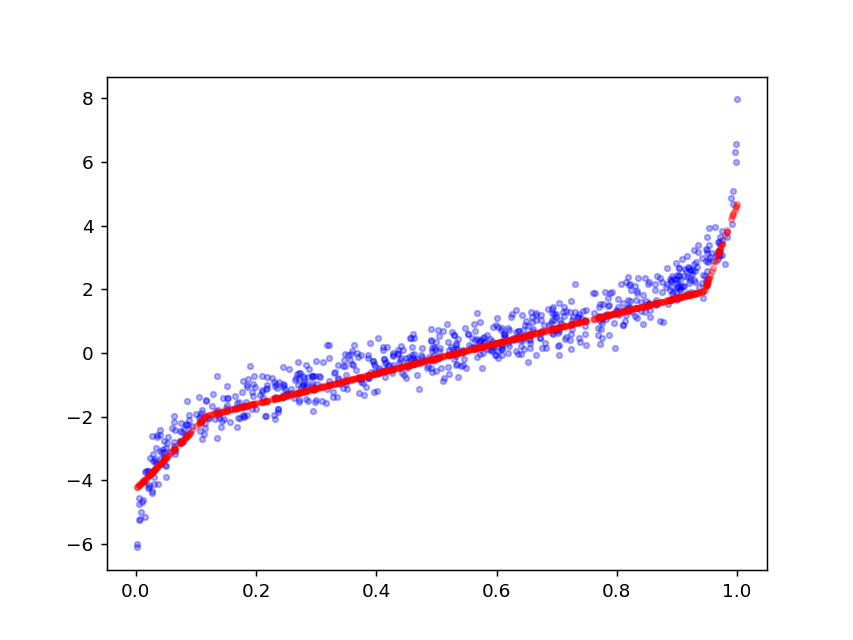

In [4]:
f,a = fa()
plot_dataset(x_train, y_train, color='b')
plot_dataset(x_train, model.predict(x_train), color='r')

<IPython.core.display.Javascript object>


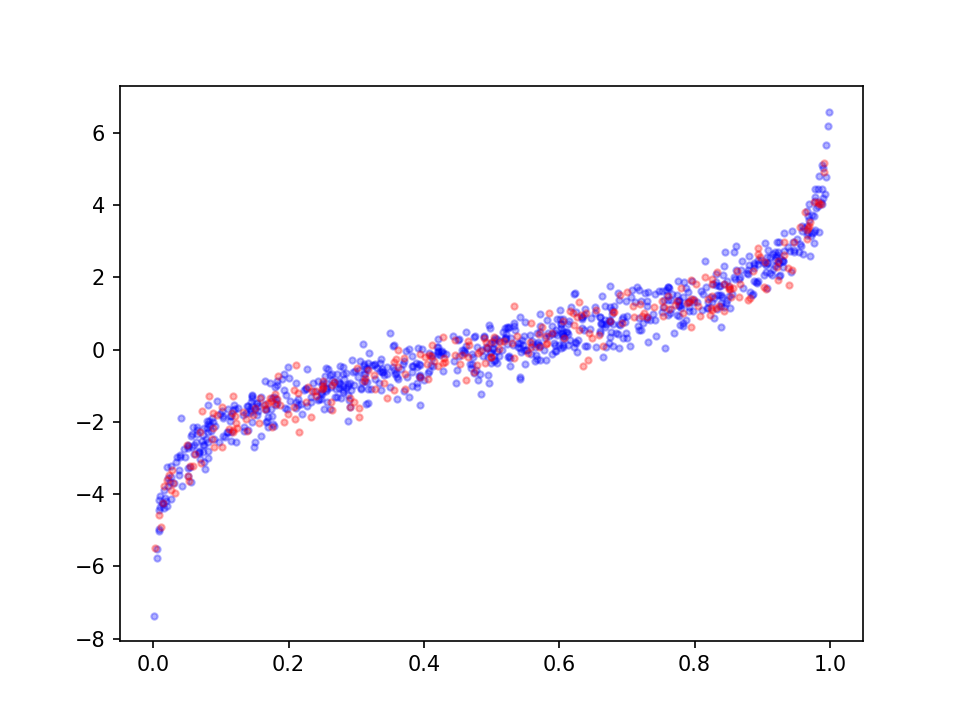

In [3]:
f,a = fa()
x_train, x_test, y_train, y_test = data_fun()
plot_dataset(x_train, y_train, color='b')
plot_dataset(x_test,  y_test, color='r')

In [4]:
# Create a Linear Model with a single weight + bias term. This is a linear regression implementation with TF.
model_1 = linear_model()
Res_1   = train_N_times(1,model_1)

<IPython.core.display.Javascript object>


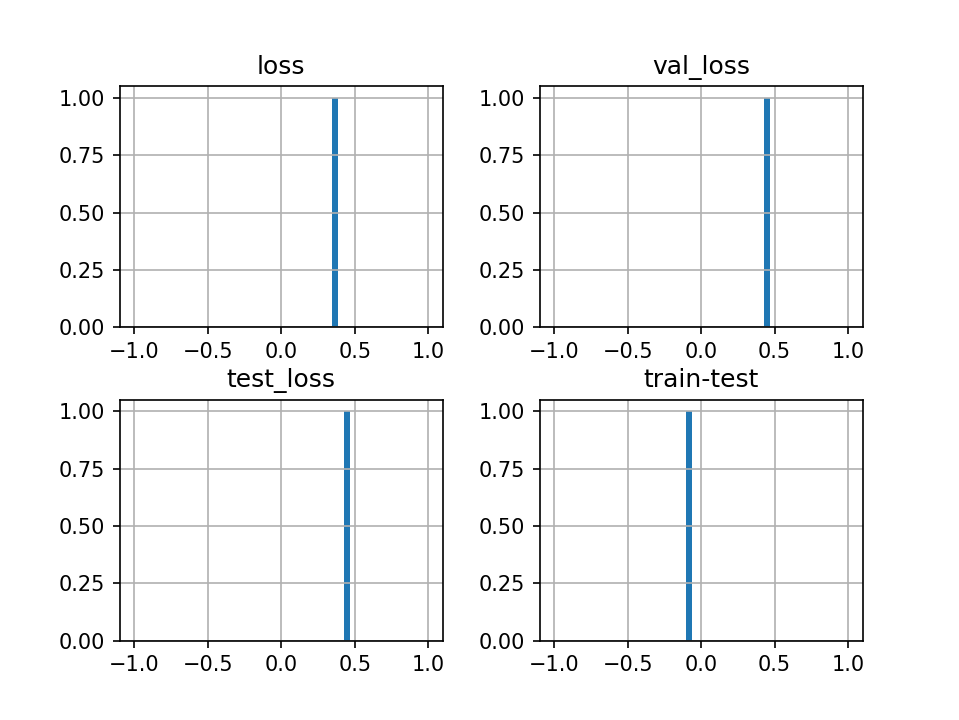

loss          0.368975
val_loss      0.441390
test_loss     0.434571
train-test   -0.072415
dtype: float64

In [5]:
#compute the distribution of loss terms for the 3 sets:
Res_1.hist(bins = np.linspace(-1,1,50))
Res_1.mean()

<IPython.core.display.Javascript object>


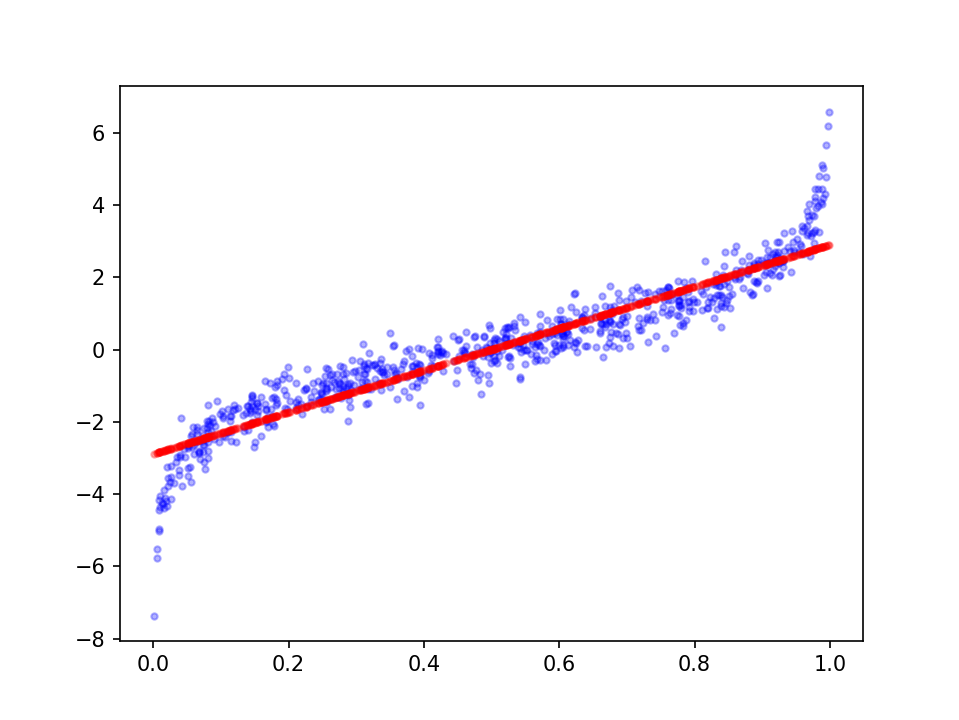

In [8]:
#plot fit
f,a = fa()
plot_dataset(x_train, y_train, color='b')
plot_dataset(x_train, model_1.predict(x_train), color='r')

## Two-parameter model

The expected outcome is that with a lack of non-linearity there will not be any difference between this model and the previous one

In [6]:
# the previous model generated a validation loss of 
# val_loss      0.601801
model_2 = linear_model(units=2)
Res_2   = train_N_times(1,model_2)

<IPython.core.display.Javascript object>


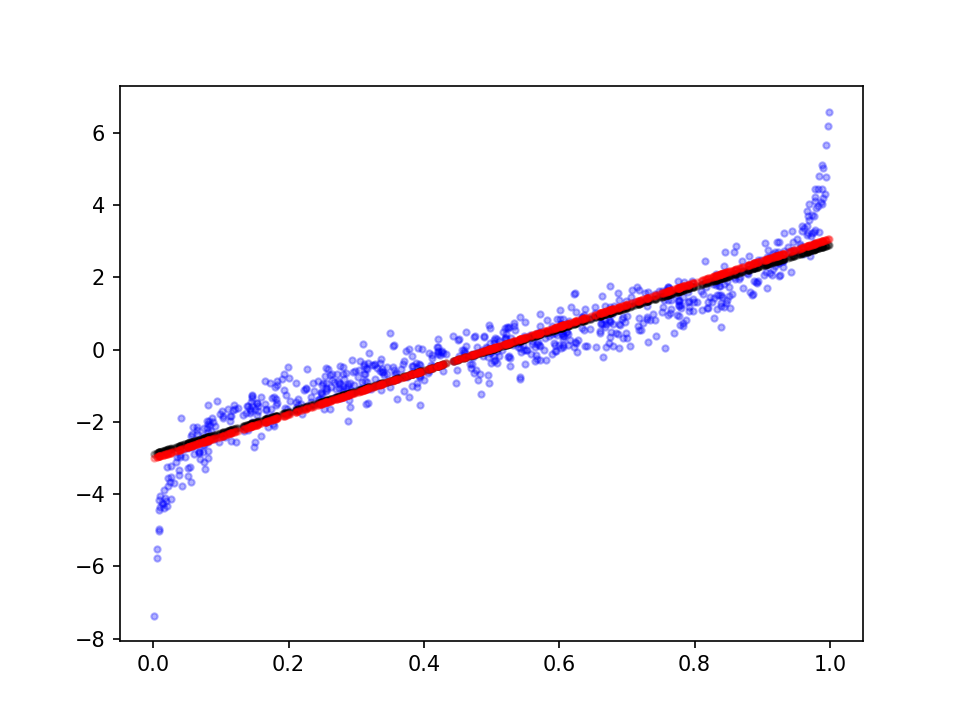

In [7]:
f,a = fa()
plot_dataset(x_train, y_train, color='b')
plot_dataset(x_train, model_1.predict(x_train), color='k')
plot_dataset(x_train, model_2.predict(x_train), color='r')

## Two parameter model with non-linear activation function

In [20]:
model_10 = linear_model(units=20,activation='relu')
# print(model_5.layers[0].get_weights())
Res_5   = train_N_times(1,model_10,verbose=True)
# print(model_5.layers[0].get_weights())

Epoch 1/1000
6/6 [==============================] - 0s 15ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 2/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 3/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 4/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 5/1000
6/6 [==============================] - 0s 4ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 6/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 7/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 8/1000
6/6 [==============================] - 0s 4ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 9/1000
6/6 [==============================] - 0s 4ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 10/1000
6/6 [==============================] - 0s 4ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 11/1000
6/6 

Epoch 84/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 85/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 86/1000
6/6 [==============================] - 0s 4ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 87/1000
6/6 [==============================] - 0s 4ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 88/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 89/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 90/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 91/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 92/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 93/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 94/1

6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 167/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 168/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 169/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 170/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 171/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 172/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 173/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 174/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 175/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 176/1000


6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 249/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 250/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 251/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 252/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 253/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 254/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 255/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 256/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 257/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 258/1000


6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 331/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 332/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 333/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 334/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 335/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 336/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 337/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 338/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 339/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 340/1000


6/6 [==============================] - 0s 4ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 413/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 414/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 415/1000
6/6 [==============================] - 0s 4ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 416/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 417/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 418/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 419/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 420/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 421/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 422/1000


6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 495/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 496/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 497/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 498/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 499/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 500/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 501/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 502/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 503/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 504/1000


6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 577/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 578/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 579/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 580/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 581/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 582/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 583/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 584/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 585/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 586/1000


6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 659/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 660/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 661/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 662/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 663/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 664/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 665/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 666/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 667/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 668/1000


6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 741/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 742/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 743/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 744/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 745/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 746/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 747/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 748/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 749/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 750/1000


6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 823/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 824/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 825/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 826/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 827/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 828/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 829/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 830/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 831/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 832/1000


6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 905/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 906/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 907/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 908/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 909/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 910/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 911/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 912/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 913/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 914/1000


6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 987/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 988/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 989/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 990/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 991/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 992/1000
6/6 [==============================] - 0s 4ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 993/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 994/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 995/1000
6/6 [==============================] - 0s 3ms/step - loss: 3.3424 - val_loss: 3.6707
Epoch 996/1000


<IPython.core.display.Javascript object>


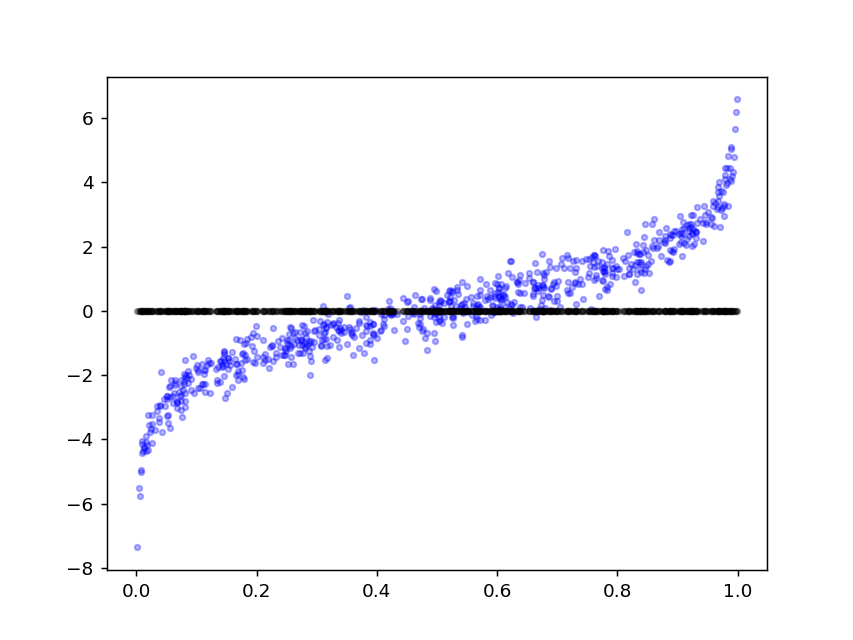

In [17]:
f,a = fa()
plot_dataset(x_train, y_train, color='b')
plot_dataset(x_train, model_5.predict(x_train), color='k')

<IPython.core.display.Javascript object>


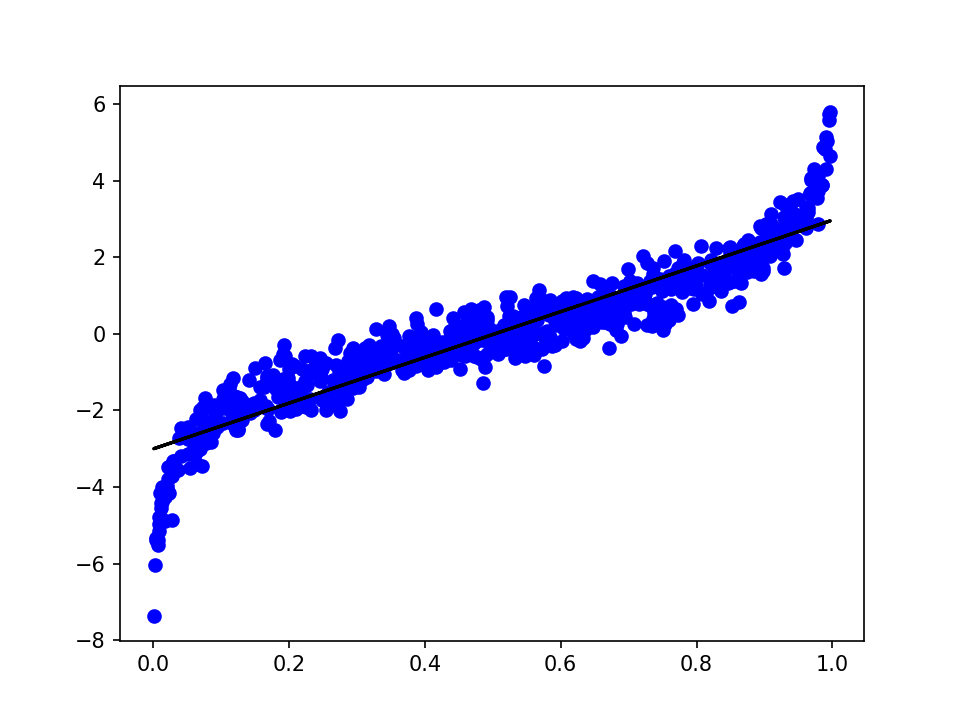

<IPython.core.display.Javascript object>


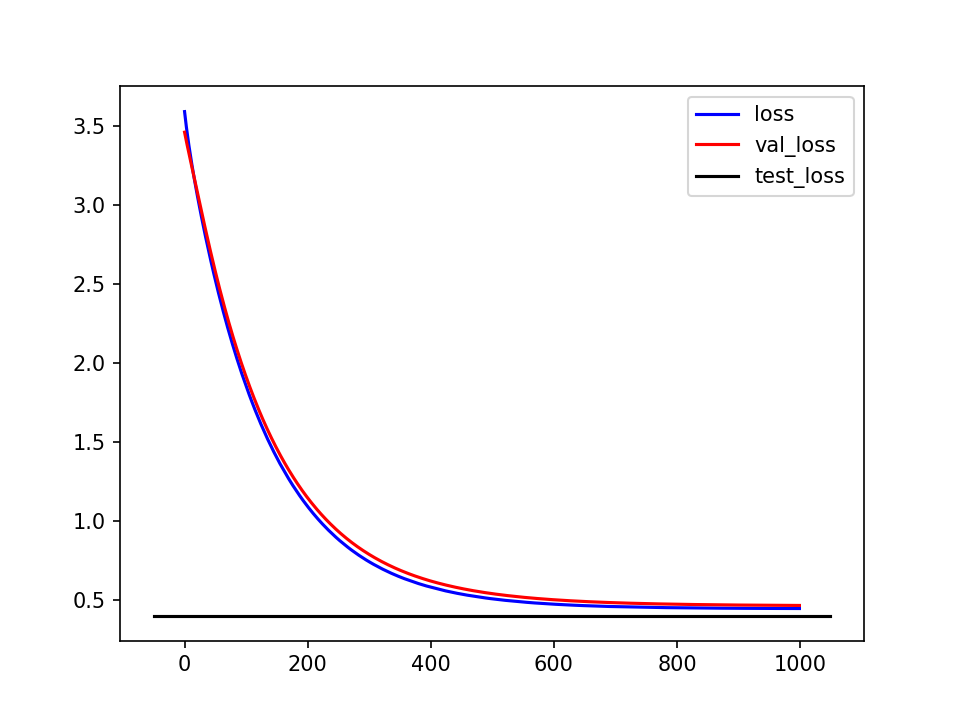

8/8 [==============================] - 0s 608us/step - loss: 0.3991


In [65]:
f,a= fa()
plt.plot(x_train,y_train,'ob')
plt.plot(x_train,model.predict(x_train),'k')
#
f,a= fa()
a.plot(H.epoch,H.history["loss"],'b')
a.plot(H.epoch,H.history["val_loss"],'r')
results = model.evaluate(x_test,y_test)
a.plot(a.get_xlim(),[results,results],'k')
a.legend(['loss','val_loss','test_loss'])

<IPython.core.display.Javascript object>


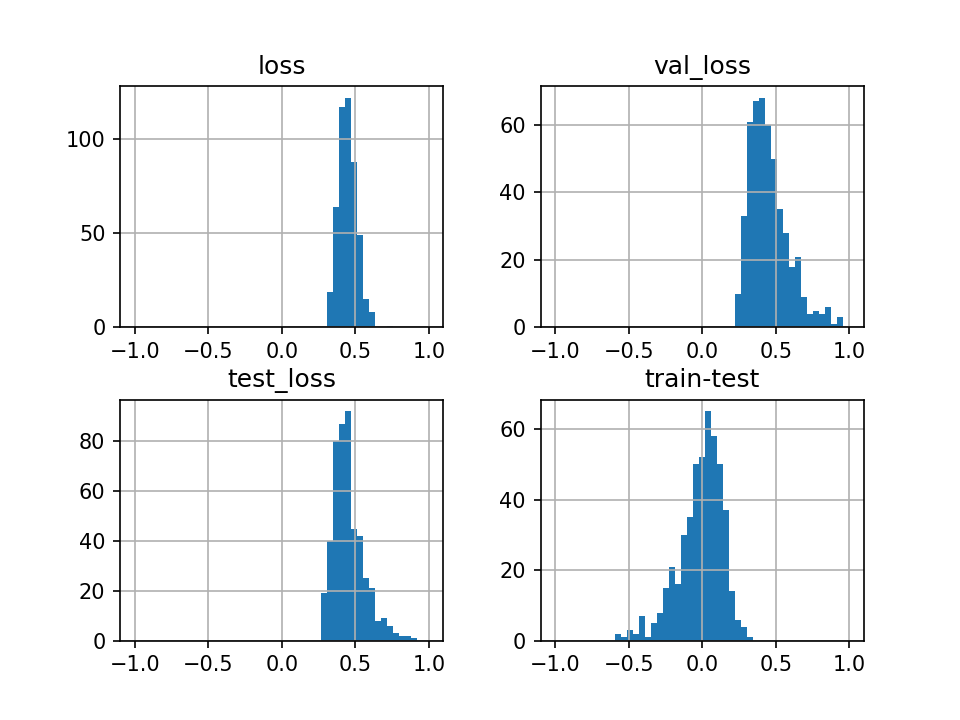

array([[<AxesSubplot:title={'center':'loss'}>,
        <AxesSubplot:title={'center':'val_loss'}>],
       [<AxesSubplot:title={'center':'test_loss'}>,
        <AxesSubplot:title={'center':'train-test'}>]], dtype=object)

In [51]:
# f,a= fa()
# a.plot(Res['loss'],'b')
# a.plot(Res['val_loss'],'r')
# a.plot(Res['test_loss'],'k')
# a.legend(Res.keys())

<IPython.core.display.Javascript object>


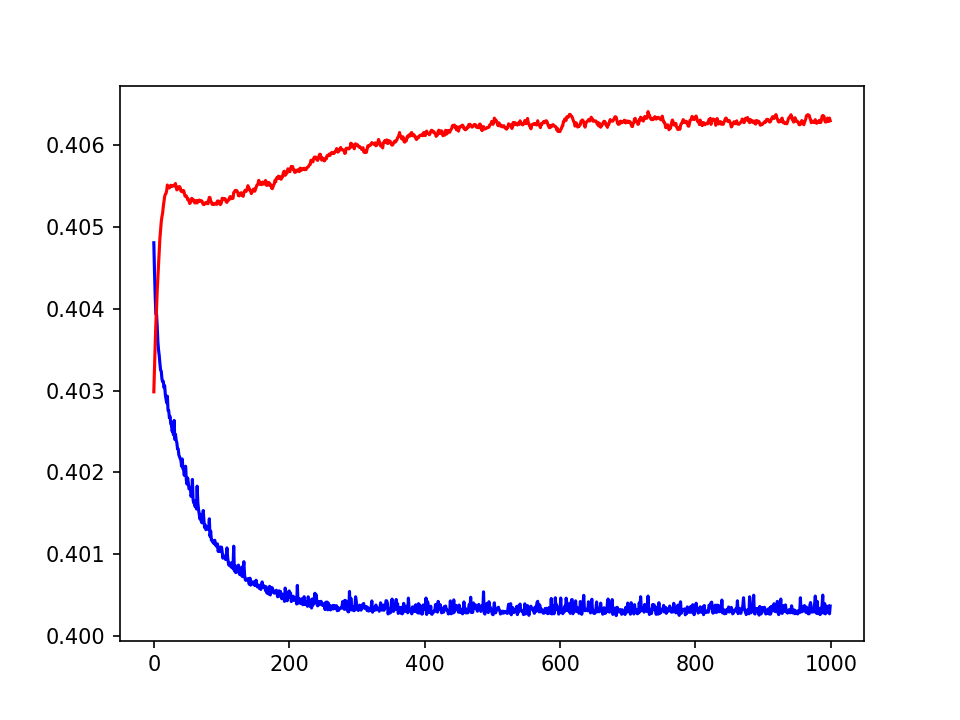

NameError: name 'results' is not defined

In [22]:
f,a= fa()
a.plot(H.epoch,H.history["loss"],'b')
a.plot(H.epoch,H.history["val_loss"],'r')
a.plot(a.get_xlim(),[results,results],'r')
a.legend(['loss','val_loss'])
f,a= fa()
a.scatter(x_test,y_test,alpha=0.3,marker='k.')
# a.scatter(data['x'],model.predict(data['x']),color='r',alpha=0.3,marker='.')

(-0.04990108922331587, 1.0488043321971843)

# Classification Example

In this example, I will train different classifiers and investigate their decision boundaries.

(3000, 2)
(3000,)


<IPython.core.display.Javascript object>


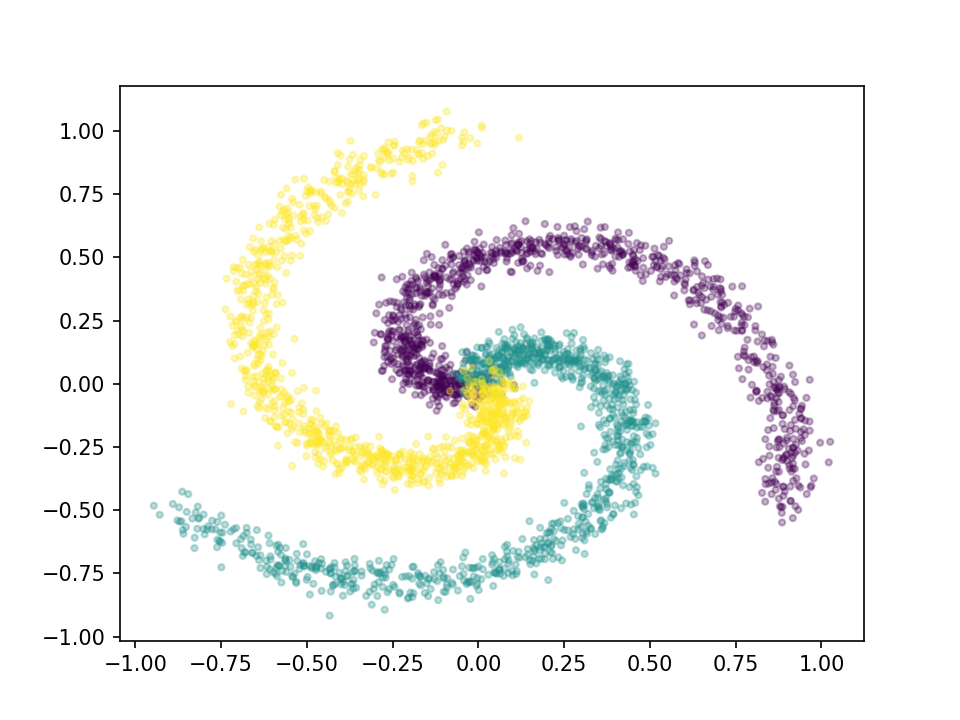

In [2]:
def data_fun(N=1000,noise=.04):
    T_C = 3 #number of categories
    Y = np.tile(np.arange(T_C),(N,1)).ravel(order='F')
    t = np.random.rand(N*T_C)
    X = np.c_[t*(np.sin( (2*np.pi/T_C)*(2*t+Y-1))),t*(np.cos( (2*np.pi/T_C)*(2*t+Y-1) ))]
    X = X + np.random.randn(N*T_C,2)*noise
    return {'X':X,'y':Y}
data = data_fun()
print(data['X'].shape)
print(data['y'].shape)
f,a= fa()
a.scatter(data['X'][:,0],data['X'][:,1],c=data['y'],alpha=0.3,marker='.')

## Linear classifier

In [3]:
X_train, X_test, y_train, y_test = train_test_split(data['X'],data['y'], 
                                                    test_size=0.33, 
                                                    random_state=42)
print(X_train.shape)
print(y_train.shape)
print(np.unique(y_train))

(2010, 2)
(2010,)
[0 1 2]


In [5]:
tf.keras.layers.InputLayer?

In [13]:
model = tf.keras.models.Sequential([
                    tf.keras.layers.InputLayer(input_shape=(2,)),
                    tf.keras.layers.Dense(10, activation=tf.nn.softmax),
                    tf.keras.layers.Dense(3, activation=tf.nn.softmax)
                                    ])
optimizer = tf.keras.optimizers.SGD()
model.compile(loss='categorical_crossentropy',optimizer=optimizer)
model.fit(X_train,y_train)

ValueError: in user code:

    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:806 train_function  *
        return step_function(self, iterator)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:796 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/distribute/distribute_lib.py:1211 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/distribute/distribute_lib.py:2585 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/distribute/distribute_lib.py:2945 _call_for_each_replica
        return fn(*args, **kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:789 run_step  **
        outputs = model.train_step(data)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:749 train_step
        y, y_pred, sample_weight, regularization_losses=self.losses)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/engine/compile_utils.py:204 __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/losses.py:149 __call__
        losses = ag_call(y_true, y_pred)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/losses.py:253 call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/util/dispatch.py:201 wrapper
        return target(*args, **kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/losses.py:1535 categorical_crossentropy
        return K.categorical_crossentropy(y_true, y_pred, from_logits=from_logits)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/util/dispatch.py:201 wrapper
        return target(*args, **kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/backend.py:4687 categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/framework/tensor_shape.py:1134 assert_is_compatible_with
        raise ValueError("Shapes %s and %s are incompatible" % (self, other))

    ValueError: Shapes (None, 1) and (None, 3) are incompatible


In [18]:

def two_hidden_layer(data, labels,activation,N_HIDDEN=1):
    INPUT_SHAPE = (data.shape[1],)
    NB_CLASSES     = np.unique(labels).shape[0]
    print(f"Building Network with 2 hidden layers alike")
    print(f"Found {NB_CLASSES} classes")
    print(f"Found {INPUT_SHAPE} input size")
    model = models.Sequential()
    
    model.add(keras.layers.Dense(N_HIDDEN,input_shape=INPUT_SHAPE,name='dense_layer', activation='relu'))
    model.add(keras.layers.Dense(N_HIDDEN,name='dense_layer_2', activation='relu'))
    model.add(keras.layers.Dense(NB_CLASSES,name='linear', activation=activation))    
    return model

def logistic(data, labels,activation):
    INPUT_SHAPE    = (data.shape[1],)
    NB_CLASSES     = np.unique(labels).shape[0]
    print(f"Building model Logistic Network alike")
    print(f"Found {NB_CLASSES} classes")
    print(f"Found {INPUT_SHAPE} input size")
    model = models.Sequential()
    
    model.add(keras.layers.Dense(NB_CLASSES,
                                 input_shape=INPUT_SHAPE,
                                 name='dense_layer', 
                                 activation=activation))
    
    return model


ValueError: Found input variables with inconsistent numbers of samples: [2, 3000]

# Linear Transformation

A linear transformation takes as input a vector and produces another vector. If you apply this to all the vectors in a space parallel lines stay parallel after the transformation.

In [ ]:
#let's see what happens to parallel lines before and after a transformation
def grid_points():
    start = list()
    B = 3 # boundary
    step = .01
    for y in np.arange(-B,B+1,step=1):
        for x in np.arange(-B,B,step=step):
            start.append([x,y])
    for x in np.arange(-B,B+1,step=1):
        for y in np.arange(-B,B,step=step):
            start.append([x,y])
    start = np.array(start)
    return np.array(start)
def grid_to_color(grid):
    B = np.max(start)
    C = np.c_[(B+start[:,0])/(B*2),np.zeros(start.shape[0]),(B+start[:,1])/(B*2)]
    return C

def plot_grid(points,boundary=3,color=False,ax=ax):
    if color:
        color  = grid_to_color(points)
        alpha = 1
    else:
        color = 'k'
        alpha = .4
    ax.scatter(points[:,0],points[:,1],s=.5,c=color,marker='.',alpha=alpha)
    ax.axis('equal')
#     ax.axis([-boundary,boundary,-boundary,boundary])
    ax.set_xticks([0])
    ax.set_yticks([0])
    ax.grid(True)

In [ ]:
start = grid_points()
W = np.array([[1,.4],[0,.4]])
print(W)
stop = W @ start.T
stop = stop.T
# print(W @ [0,1])
fig, ax = plt.subplots(1,1)
plot_grid(start,color=False,ax=ax)
plot_grid(stop,color=True,ax=ax)
# ax.quiver(start[:,0],start[:,1], stop[:,0], stop[:,1], color=['k'])

In [ ]:
#an example of non-linear transformation
def f(v):
    return np.c_[v[:,0] + np.sin(v[:,0]),v[:,1] + np.sin(v[:,0])]

stop = f(start)
fig, ax = plt.subplots(1,1)
plot_grid(start,color=False,ax=ax)
plot_grid(stop,color=True,ax=ax)
print(f(np.array([[1,1]])))

# Non-linear Least Squares

https://www.youtube.com/watch?v=RyhOBY5qUQI
https://www.youtube.com/watch?v=lsKIhNkzpbw

This is the function we would like to fit, it has two parameters, a and b.
$$ f(x) = ax\sin(bx) $$

Error is defined as follows:

$$ E(a,b) = \sum_{k=0}^{m}(f(x_k) - y_k)^2 $$

Let's plug our function in it:

$$ E(a,b) = \sum_{k=0}^{m}( ax_k\sin(bx_k) - y_k)^2 $$

We need to find the minimum of this function. At minimum two partial derivatives of $E(a,b)$ wrt $a$ and $b$ are both zeros.

$$ \frac{dE}{da} = 0, \frac{dE}{db} = 0 $$

$$ F(a,b) = \frac{dE}{da} = \sum_{k=0}^{m}2(ax_k\sin(bx_k)-y_k)x_ksin(bx_k) = 0$$

This is because of the chain rule $g(f(x))$ where $g(x) = x^2$. Applying the chain rule to $g(f(x))'$ results in $g'(f(x))f'(x)$.

$$ G(a,b) = \frac{dE}{db} = \sum_{k=0}^{m}2(ax_k\sin(bx_k)-y_k)cos(bx_k)x_k = 0$$

We got as many equations as the number of variables. This is a system of two non-linear equations with both two parameters, $F(a,b) = 0$ and $G(a,b) = 0$. This is not a linear system. You can solve this with the Newton's method to the system.

Because these are non-linear, there is no existence or uniqueness of solutions. Especially, here are we are dealing with sines, there will be probably multiple solutions.

## Newtons' Method

Choose an initial guess: $z^0 = [a^0,b^0]$. The Newton iteration is 

$$ X_{k+1} = X_{k} - \frac{f(X_k)}{f'(X_k)} $$

This iteration will bring the value of X to a special point in the error landscape. But right now $X$ is a vector-valued variable, and we have two functions $F(a,b)$ and $G(a,b)$ both with two variables; therefore we need to introduce Jacobian Matrix. Also this returns only the critical points, which are either minimum, maximum or saddle points.

## Jacobian Matrix

$$ J(a,b) =  \begin{bmatrix}
\frac{\delta F}{\delta a} & \frac{\delta F}{\delta b}\\
\frac{\delta G}{\delta a} & \frac{\delta G}{\delta b}
\end{bmatrix}
$$

The J matrix depends on the input variable. So it is not a conventional matrix with fixed values, the values are changing with its arguments, which is a vector.

Planting this in the Newton's iteration above we have to consider that J is a matrix.

$$ X_{k+1} = X_{k} - J^{-1}(X_k) \begin{bmatrix}F(X_k)\\G(X_k) \end{bmatrix}, X_k=[a,b] $$

So we have these two equations with two variables, that we need to differentiate to create the Jacobian:

$$ F(a,b) = \frac{dE}{da} = \sum_{k=0}^{m}2(ax_k\sin(bx_k)-y_k)x_ksin(bx_k) = 0$$
$$ G(a,b) = \frac{dE}{db} = \sum_{k=0}^{m}2(ax_k\sin(bx_k)-y_k)cos(bx_k)x_k = 0$$

In [ ]:
#let's generate some data first:
x = np.linspace(-10.,10.,100)
params = {'a' : 0.4, 'b' : 0.2,'x' : x}
def fun(x,a=1.,b=1.):
    return a*x*np.sin(b*x)

def data(fun,**kwargs):
    y = fun(**kwargs) 
    y = y + np.random.randn(y.shape[0])*2
    return y

#plot the error surface
def errorfunction(y,fun,**kwargs):
    e = np.sum((fun(**kwargs) - y) ** 2)
    return e

def error_surface(param_space,y,fun,**kwargs):
    e = list()
    for a in param_space:
        for b in param_space:
            params['a'] = a
            params['b'] = b
            e.append(errorfunction(y,fun,**params))
    e = np.reshape(e,[T,T])
    return e

y = data(fun,**params)
fig, ax = plt.subplots(1,1)
ax.plot(x,y)
ax.plot(x,fun(**params))
ax.set_title(f"Error is {np.round(errorfunction(y,fun,**params),2)}")
ax.legend(['data','generating model'])

fig, ax = plt.subplots(1,1)
T = 100
param_space = np.linspace(-3.,3.,T)
S = error_surface(param_space,y,fun,**params)
ax.matshow(np.log10(S),extent=(np.min(param_space),np.max(param_space),np.min(param_space),np.max(param_space)))

# Back Propagation:
based on the first lecture Deep Learning from LeCun:

https://www.youtube.com/watch?v=d9vdh3b787Y&list=PLLHTzKZzVU9eaEyErdV26ikyolxOsz6mq&index=4&t=0s
    
    
- Algorithm that learns from the training set is expected to generalize to the test set because of the redundancy in the dataset.

- NN: Stacked linear and non-linear blocks. Without non-linearities the network collapses to a single matrix.

- $$ s[i] = \sum_{j\in{UP(i)}}{ w[i,j] z[j] } $$ 

- UP operator means all precessor of j.

- The activation of unit $s[i]$ at the next layer, is the weighted sum of all activations from the previous layer z[j] using the weights w[i,j].

- s[j] -> non-linear function h -> z[j] -> weighted sum -> s[i] -> non-linear fun h -> z[i]

- h is non-linear activation function

- $$ z_j = h(s_j) $$ 

- weights makes data move from one layer to the next

- $$ s_i = z_j * w_{i,j} $$

- $$ z_i = h(s_i) $$

- Chain Rule:

$$ g(h(s))' = g'(h(s))h'(s) $$

- So the change rate of a function of a function, $g(h(s))$, is related to derivative of the inner function weighted by the derivative of the outer function evaluated at that point. 

- In words, if the outer function has a derivative of zero, changes originating from the first function will be cancelled. If you are located on the far tail of a sigmoid function, however strongly you perturb the input variable and the inner function, the plateau of the sigmoid will simply cancel all this changes.

- The outer function can also amplify the change rate of the first function.

- So from one layer to the next, the question we are asking, is how much a perturbation $\Delta s$ results in changes in the cost function. We just ask this question at every single layer of the network to span the whole depth.

    - when the first activation is perturbed by $\Delta s_1$, the subsequent layer $z_1$ is perturbed by $\Delta z_1$, which is equal to $h'(s_1)\Delta s_1$.
    
    - The same holds also for subsequent layer $s_2$, which is $\Delta s_2 = w\Delta z_1$
    - Replacing $\Delta z_1$ with the above equality, we obtain $\Delta s_2 = w\Delta h'(s_1)\Delta s_1$
    - this pattern is chained together for the rest of the network.

# Soft(arg)max

Softmax takes a vector of real number scores (logits, logits are output of the network) and converts them to a probability distribution in the sense that these numbers sums to 1 after passing through the softmax. It returns the another vector of same size.

Typically, we need to find the class with maximum score, however this argmax operation is not differentiable. Instead with softmax we try to "soften" this max operation and make out of it a differentiable function.

The question is why actually we use a base of $e$ to achieve this. Actually any base would produce exactly the same result as to achieving a unit sum. Using a base that is bigger than $e$ would result in even more sparse distribution of probabilities, (or said the otherway, using a base close to 1 would make the probabilities more uniform than $e$).

Interesting discussion:
https://datascience.stackexchange.com/questions/23159/in-softmax-classifier-why-use-exp-function-to-do-normalization#:~:text=You%20said%20%22the%20softmax%20function,the%20predictions%20and%20the%20truth%22.&text=With%20the%20same%20reasoning%20we,Exaggerating%20here%2C%20of%20course).

$$\sigma(z) = \frac{e^z}{\sum_j{e^{z_j}}}$$

## Example

In [ ]:
def softmax(Z,base=math.e):
    return base ** Z / np.sum(base ** Z)
    
scores = np.array([1,4,8,10])
# plt.plot(scores,'o-')
plt.plot(softmax(scores,1.1),'go-')
plt.plot(softmax(scores),'ro-')
plt.plot(softmax(scores,5),'mo-')
plt.plot(softmax(scores,10),'ko-')

# Log Loss

This is a cost function that can be used in a classification context for optimizing probabilities, which are always in the range between 0 and 1. The closer probabilities reach to 1 for the correct class the bigger the loss function. 

$log(close to 1)$ is a big negative number close to zero, whereas for extremely small number, the log returns very small negative numbers.

# Entropy

Entropy measures the uncertainty of a discrete distribution. It is maximized when all elements are uniformly distributed, and minimized when all the probability density is located only on one unique class (deterministic distribution).

$$H(X)=-\sum_kp(x_k)*log_2(p(x_k))$$

The uniform distribution with K classes has an entopy of $-log_2(1/K)$. For 5 classes we have 2.32.

Entropy is the number of bits that a communication channel needs to use to optimally transmit a set of states.
Example: We would like to communicate 8 states over a communication channel. These could be encoded as [000,001,010,...,111], totaling to $2^3$ messages. It is straightforward to see that when every single message occurs equally likely this communication requires 3 bits of information transmitted on average.

Now, if some of the states happened to be more often than others, we could code them with messages that are smaller in size to reduce the total average number of bits transmitted. Therefore there is an optimal way of encoding a state in terms of the lenght of the message that is sent.

KL divergence measures the difference in the number of bits when encoding a bunch of states coming from situation B, using an optimal set of messages for situation A.

# KL-Divergenz (relative entropy)
(Nice read on entropy: https://www.youtube.com/watch?v=ErfnhcEV1O8)

Measures the dissimilarity between two distributions p and q.

$$ KL(p || q ) = \sum_k{p_klog_2(\frac{p_k}{q_k})}$$ 

re-write this after expanding the ratio:

$$ KL(p || q ) = \sum_k{p_k ( log_2(p_k)-log_2(q_k))}$$ 

$$ KL(p || q ) = \sum_k{p_klog_2(p_k)-p_klog_2(q_k)}$$ 

$$ KL(p || q ) = \sum_k{p_klog_2(p_k)}-\sum_k{p_klog_2(q_k)}$$ 

$$ KL(p || q ) = -H(p) - \sum_k{p_klog_2(q_k)}$$ 

$$ KL(p || q ) = -H(p) + H(p,q)$$ 

which tells us that the KL-distance is the difference between two terms. The first one is the entropy of X and the second is the cross-entropy of $q$ relative to $p$.

$$ H(p,q) = -\sum_k{p_klog_2(q_k)} $$

Cross-entropy tells us the average number of bits needed to encode data coming from source  p using a codebook that is optimal for source q. This will be a number that is always bigger than the entropy of the source, unless p = q.

KL divergence tells us about the number of extra bits required to encode the data when we use the model q to represent data in p. KL divergence is always positive and equal to 0 when p = q.

## Exercice:
The following shows the asymmetrical property of the DKL distance. 

$DKL(p||q)$ means the increase in average transmitted number of bits for tranmitting $p$ when the codebase is optimal for $q$:

![DKL](pics/DKL_00.png)
![DKL](pics/DKL_01.png)
![DKL](pics/DKL_02.png)
![DKL](pics/DKL_03.png)
![DKL](pics/DKL_04.png)
![DKL](pics/DKL_05.png)
![DKL](pics/DKL_06.png)
![DKL](pics/DKL_07.png)

In [ ]:
def Xentropy(x,y):
    return -np.dot(x, np.log2(y))

u = np.tile(np.array(1/5),(5,))
x = np.array([0.3,.2,.1,.2,.3])
y = np.array([0.3,.2,.1,.15,.35])
z = np.array([0.3,.2,.1,.35,.05])
a = np.array([.025,.025,0.9,.025,.025])

    
print(f"Entropy of u {Xentropy(u,u)} (max)")
print(f"Entropy of x {Xentropy(x,x)}")
print(f"Entropy of y {Xentropy(y,y)}")
print(f"Entropy of a {Xentropy(a,a)}")
print(f"X-Entropy of x,y {Xentropy(x,y)}")
print(f"X-Entropy of x,z {Xentropy(x,z)}")
print(f"X-Entropy of x,a {Xentropy(x,a)}")
print(f"X-Entropy of x,u {Xentropy(x,u)}")
print(f"KL(x,y) = {-Xentropy(x,x) + Xentropy(x,y) }")
print(f"KL(x,z) = {-Xentropy(x,x) + Xentropy(x,z) }")
print(f"KL(x,a) = {-Xentropy(x,x) + Xentropy(x,a) }")

In [ ]:
# 

# Sigmoid function (aka Logistic function)
The general form of a sigmoid function is as follows
$$ p(x) = \frac{1}{1 + e^{-x}}$$
This is equivalent to 
$$ p(x) = \frac{e^x}{e^x + 1}$$

What this function does is to take the ratio of 1 to $1+e^{-x}$. 

At zero, the denominator is 2 ($e^0 = 1$), therefore we have 1/(1+1) and the sigmoid is equal to 0.5 at x = 0. 

When $x$ goes to plus infinity, the exponential term goes to zero, hence denominator becomes more and more equal to nominator $\frac{1}{1+smallnumber}$, asymptoting at 1. 

When $x$ goes to minus infinity, the denominator grows hence the ratio approaches to 0.

The equivalent formulation is easier to grasp. The contribution of the plus 1 terms gets smaller and smaller with increasing x.

In logistic regression, we generally have a linear function in the exponent, in the form $w_0 + w_1X + ...$. In this case, if the slope parameters are 0, we obtain a horizontal line, whereas the strength of the slope determines the steepness of the sigmoid. And when the intercept is 0, the sigmoid equals 0.5 at point 0. The intercept therefore shifts the sigmoid left and right.

<IPython.core.display.Javascript object>


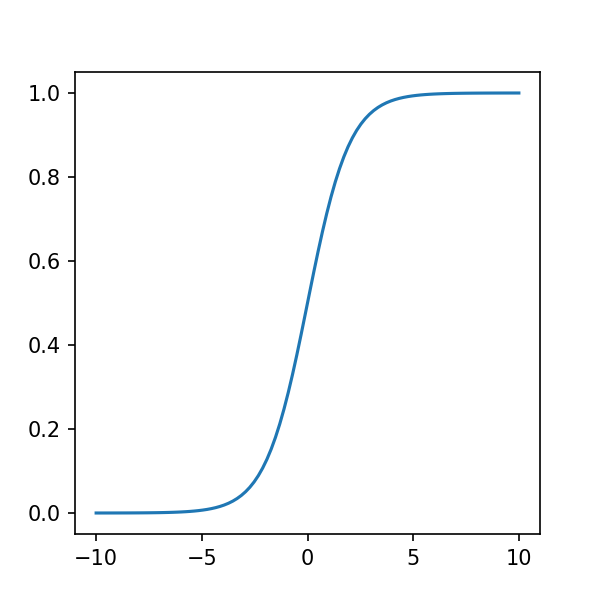

In [73]:
## Sigmoid
def sigm(x):
    return 1. / (1. + np.exp(-x))
x = np.linspace(-10.,10.,100)    
fig,ax = plt.subplots(1,1,figsize=(4,4))
ax.plot(x,sigm(np.array(x)))

# Logit transformation

This is a transformation applied to probabilities, so numbers with the range of 0 and 1. After this transformation we obtain odds which are not anymore bounded between 0 and 1.

$$logit(p) = log(\frac{p}{1-p}) $$

This is this transformed values that the logistic regression tries to model.

$$logit(p) = w^TX$$

which is equal to 

$$log(\frac{p}{1-p}) = w^TX$$

or without the matrix notation

$$log(\frac{p}{1-p}) = w_0 + w_1X$$

we can recover the odds by exponentiating

$$\frac{p}{1-p} = e^{w_0 + w_1X}$$

and the predicted probability $p$ would be equal to

$$ p = \frac{1}{1+e^{-(w_0 + w_1X)}} = \frac{e^{w_0 + w_1X}}{e^{w_0 + w_1X}+1}$$

which is exactly the sigmoid (logistic) function. Note how formulating everything in terms of logits make it easier to grasp the overall idea.

The more the term $wX$ at the exponent grows towards infinity the closer we approach the upper asymptote, and vice versa.

<IPython.core.display.Javascript object>


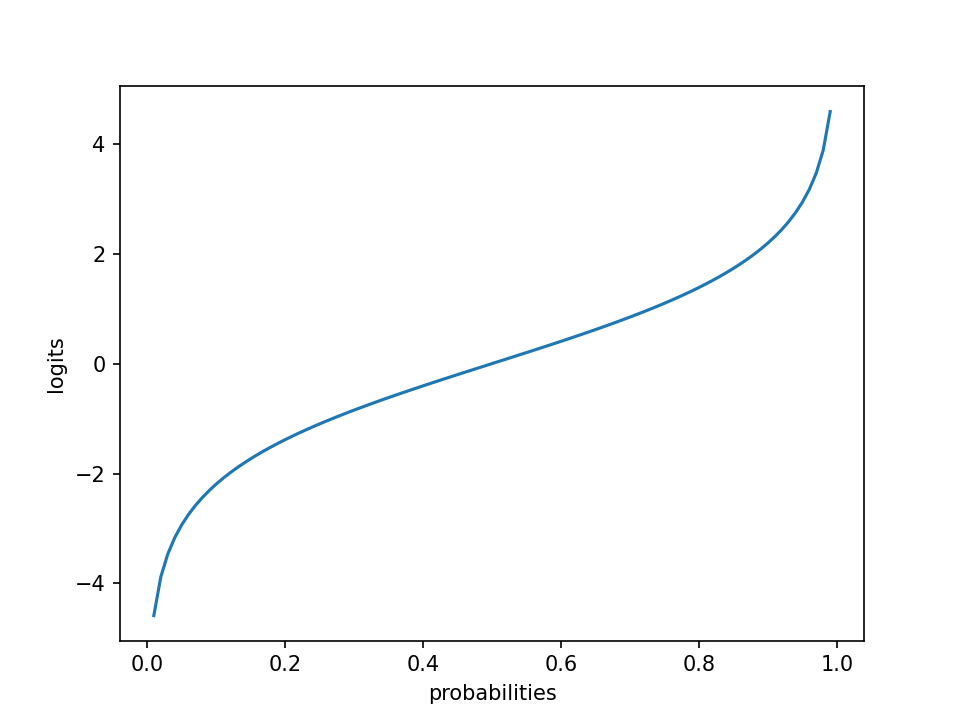

/Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


Text(0, 0.5, 'logits')

In [25]:
def logit_transform(p):
    return np.log(p/(1-p))

f,a = fa()
p = np.linspace(0,1,100)
a.plot(p,logit_transform(p))
a.set_xlabel('probabilities')
a.set_ylabel('logits')

# Nomenclature Clarification

- Logit Transformation transforms probabilities (bounded between [0,1]) to [-Inf, +Inf]. This is a vertically standing sigmoid if you will. 
- In tensorflow the output of this conversion is called logits (super confusing).
- Softargmax takes a bunch of logits and generates a new vector that sums to 1, thus it create a p.d out of these numbers.
- Squashing the range [-Inf,+Inf] to a bounded range is done with a Sigmoid function and it is the inverse operation of Logit Transform. 

# Logistic Regression

Logistic regression is a linear regression applied on logit transformed probabilities. 

$$ p(y | x, w)$$ which is $$ Bernouilli(y | sigmoid(w^Tx)) $$

For example one can model the probability of having at least one trafic accident in relation to average speed of driving. For each person, one could have a binary variable (accident or not) to be predicted by a continous number (speed).

The negative log-likelihood function on parameters runs through all data points

$$ L(w) = \sum_i^N{\log[ p_i^{y_{i}} \times (1-p_i)^{(1-y_{i})} ]} $$

In this equation above,
- predicted values are probabilities, $p_i$, and
- target values are $y_i$ which play the role of indicator variable. 

It is either class 1 or 0 which is the true class.

This can also be written in the following form without loss of generality:

$$ L(w) = \sum{y_i\log(p_i)} = y_i \log{p_i} + (1-y_i) \log{1-p_i} $$

This similarity of this loss function to Cross-Entropy is now clearer.





<IPython.core.display.Javascript object>


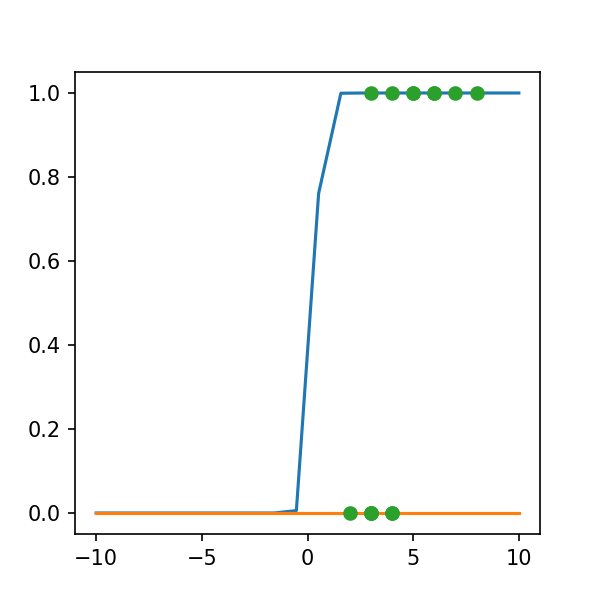

[[  0.   0.   0.  nan]
 [  0.   0.   0.  nan]
 [  0.   0.   0.  nan]
 [  0.   0.   0.  nan]
 [  0.   0.   0.  nan]
 [  0.   0.   0.  nan]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]]
loss:
-inf
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.

/Users/sonat/Documents/repos/ornament_symmgroups/.env/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in exp
/Users/sonat/Documents/repos/ornament_symmgroups/.env/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in exp
/Users/sonat/Documents/repos/ornament_symmgroups/.env/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log10
/Users/sonat/Documents/repos/ornament_symmgroups/.env/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in multiply


-125.22847819621617

In [68]:
#this is how you define machine epsilon with python
EPSILON = np.finfo(float).eps
#example
np.set_printoptions(suppress=True)
#data
x = np.array([3,4,3,2,4,3,5,4,6,7,8,6,5,3,]) # x values
y = np.array([0,0,0,0,0,0,1,1,1,1,1,1,1,1,]) # labels
#
w = np.array([-2500.,6])                     # the model parameters bad example
w2 = np.array([-2.,6])                     # the model parameters reasonable example
X = np.c_[np.ones(x.shape[0]),x]             # Design matrix
C = np.ones(20)                              # Constant
x_axis = np.linspace(-10,10,20)                # 
x_axis = np.c_[C,x_axis]

def logistic(x):
    return 1. / (1. + np.exp(-x))

def cross_entropy_robust(w,verbose=True):
    EPSILON    = np.finfo(float).eps
    y_hat      = logistic(X @ w)
    first_sum = (1-y) * np.log10(1-y_hat+EPSILON)
    second_sum  = y * np.log10(y_hat+EPSILON)
    loss       = np.sum(first_sum[y == 0]) + np.sum(second_sum[y == 1])
    if verbose:
        print(np.c_[y,y_hat,first_sum,second_sum])
        print('loss:')
        print(loss)
    return loss

def cross_entropy(w,verbose=True):
    y_hat = logistic(X @ w)
    first_sum   = (1-y) * np.log10(1-y_hat)
    second_sum  = y     * np.log10(y_hat)
    loss = np.sum(first_sum[y == 0]) + np.sum(second_sum[y == 1])
    if verbose:
        print(np.c_[ y , y_hat , first_sum , second_sum])
        print('loss:')
        print(loss)
    return loss

fig,ax = plt.subplots(1,1,figsize=(4,4))
ax.plot(x_axis[:,1],logistic(x_axis @ w2))
ax.plot(x_axis[:,1],logistic(x_axis @ w))
ax.plot(x,y,'o')
cross_entropy(w)
cross_entropy_robust(w)

The aim is to find the w vector that maximizes the cross_entropy.
if your starting values are totally off (try to put in w values that are super wrong), 
one might easily end up with problems:
- -Inf problem, because logistic function returns 0 and log(0) is -Inf. 
- And the Nan problem, which is actually caused by -Inf * 0, returning NaN.

In [69]:
#show the error surface
GS = 100 # grid size
L = np.zeros((GS,GS))
params = np.linspace(-50,50,GS)
for i,B0 in enumerate(params):
    for j,B1 in enumerate(params):
        w = np.array([B0,B1])
        print(w)
        L[i,j] =  cross_entropy_robust(w,verbose=True)
L        

[-50. -50.]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-50.         -48.98989899]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        

 [  1.           0.          -0.         -15.1773151 ]]
loss:
-83.17056168499654
[-48.98989899   5.55555556]
[[  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  1.           0.          -0.          -9.21230703]
 [  1.           0.          -0.         -11.62501365]
 [  1.           0.00000016  -0.          -6.79956014]
 [  1.           0.00004104  -0.          -4.38683077]
 [  1.           0.01050384  -0.          -1.97865172]
 [  1.           0.00000016  -0.          -6.79956014]
 [  1.           0.          -0.          -9.21230703]
 [  1.           0.          -0.         -14.02740659]]
loss:
-64.04163706465927
[-48.98989899   6.56565657]
[[  0.           0.          -0.          -0.        ]
 [  0.      

 [  1.           0.          -0.         -10.52834782]]
loss:
-27.152566239169094
[-46.96969697   8.58585859]
[[ 0.          0.         -0.         -0.        ]
 [ 0.          0.00000328 -0.00000143 -0.        ]
 [ 0.          0.         -0.         -0.        ]
 [ 0.          0.         -0.         -0.        ]
 [ 0.          0.00000328 -0.00000143 -0.        ]
 [ 0.          0.         -0.         -0.        ]
 [ 1.          0.01728629 -0.         -1.76229817]
 [ 1.          0.00000328 -0.         -5.48351761]
 [ 1.          0.98949616 -0.         -0.00458589]
 [ 1.          0.99999802 -0.         -0.00000086]
 [ 1.          1.         -0.         -0.        ]
 [ 1.          0.98949616 -0.         -0.00458589]
 [ 1.          0.01728629 -0.         -1.76229817]
 [ 1.          0.         -0.         -9.21230703]]
loss:
-18.229596469683717
[-46.96969697   9.5959596 ]
[[ 0.          0.00000001 -0.00000001 -0.        ]
 [ 0.          0.00018669 -0.00008109 -0.        ]
 [ 0.          0.00

[-44.94949495  -8.58585859]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-44.94949495  -7.57575758]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.     

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-43.93939394  47.97979798]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-43.93939394  48.98989899]
[[  0.           1.         -15.65355977   0.        ]
 [  0.      

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-40.90909091 -48.98989899]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-40.90909091 -47.97979798]
[[  0.           0.           0.          -0.        ]
 [  0.    

[-39.8989899  19.6969697]
[[  0.           1.          -8.33494459  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.          -8.33494459  -0.        ]
 [  0.           0.37635452  -0.20506222  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.          -8.33494459  -0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.          -0.        ]]
loss:
-56.51701553747266
[-39.8989899   20.70707071]
[[  0.           1.          -9.65098813  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.          -9.65098813

loss:
-125.22847819621617
[-37.87878788 -21.71717172]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-37.87878788 -20.70707071]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.     

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-35.85858586 -39.8989899 ]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-35.85858586 -38.88888889]
[[  0.           0.           0.          -0.        ]
 [  0.    

[-34.84848485  22.72727273]
[[  0.           1.         -14.44943979  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -14.44943979  -0.        ]
 [  0.           0.99997524  -4.60616435  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -14.44943979  -0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.          -0.        ]]
loss:
-79.26160327597684
[-34.84848485  23.73737374]
[[  0.           1.         -15.35252978   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.352529

[-32.82828283   2.52525253]
[[  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  1.           0.          -0.          -8.77362584]
 [  1.           0.          -0.          -9.87032842]
 [  1.           0.00000002  -0.          -7.67692266]
 [  1.           0.00000026  -0.          -6.58021954]
 [  1.           0.00000328  -0.          -5.48351761]
 [  1.           0.00000002  -0.          -7.67692266]
 [  1.           0.          -0.          -8.77362584]
 [  1.           0.          -0.         -10.96702343]]
loss:
-65.80218601062056
[-32.82828283   3.53535354]
[[ 0.          0.         -0.         -0.        ]
 [ 0.          0.00000001 -0.         -0.        ]
 [ 0.          0.         -0.         -0.     

[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-30.80808081 -33.83838384]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.          -0.        ]]
loss:
-82.75863310840131
[-29.7979798   22.72727273]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           0.99999984  -6.79956014  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-85.06735901099627
[-29.7979798   23.73737374]
[[  0.           1.         -15.65355977   0.        ]
 [  0.      

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-27.77777778 -21.71717172]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-27.77777778 -20.70707071]
[[  0.           0.           0.          -0.        ]
 [  0.    

-93.92135864716214
[-26.76767677  43.93939394]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-26.76767677  44.94949495]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.

 [  1.           1.          -0.          -0.        ]]
loss:
-82.29422408579364
[-24.74747475  20.70707071]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           0.99999994  -7.23824139  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-85.50604026070694
[-24.74747475  21.71717172]
[[  0.           1.         -15.65355977   0.        ]
 [  0.      

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-22.72727273 -35.85858586]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-22.72727273 -34.84848485]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-89.45415024678665
[-21.71717172  24.74747475]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -12.06361017  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-90.33140904583642
[-21.71717172  25.75757576]
[[  0.           1.         -15.65355977   0.        ]
 [  0.      

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-19.6969697  -20.70707071]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-19.6969697 -19.6969697]
[[  0.           0.           0.          -0.        ]
 [  0.      

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-17.67676768 -21.71717172]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-17.67676768 -20.70707071]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-15.65656566 -37.87878788]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-15.65656566 -36.86868687]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-14.64646465  42.92929293]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-14.64646465  43.93939394]
[[  0.           1.         -15.65355977   0.        ]
 [  0.      

 [ 1.          0.00000072 -0.         -6.14153844]]
loss:
-53.519120740861254
[-12.62626263   0.50505051]
[[ 0.          0.00001495 -0.00000649 -0.        ]
 [ 0.          0.00002476 -0.00001076 -0.        ]
 [ 0.          0.00001495 -0.00000649 -0.        ]
 [ 0.          0.00000902 -0.00000392 -0.        ]
 [ 0.          0.00002476 -0.00001076 -0.        ]
 [ 0.          0.00001495 -0.00000649 -0.        ]
 [ 1.          0.00004104 -0.         -4.38683077]
 [ 1.          0.00002476 -0.         -4.60616435]
 [ 1.          0.000068   -0.         -4.16750183]
 [ 1.          0.00011267 -0.         -3.94818059]
 [ 1.          0.00018669 -0.         -3.72887209]
 [ 1.          0.000068   -0.         -4.16750183]
 [ 1.          0.00004104 -0.         -4.38683077]
 [ 1.          0.00001495 -0.         -4.82550073]]
loss:
-34.21742787633417
[-12.62626263   1.51515152]
[[ 0.          0.00030933 -0.00013436 -0.        ]
 [ 0.          0.00140592 -0.00061101 -0.        ]
 [ 0.          0.0003093

 [  1.           0.           0.         -15.63858824]]
loss:
-125.21350562574086
[-10.60606061  -8.58585859]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355976]
 [  1.           0.           0.         -15.65350089]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355976]
 [  1.           0.           0.         -15.41647837]]
loss:
-124.99133788940904
[-10.60606061  -7.57575758]
[[  0.           0.          -0.          -0.        ]
 [  0.    

[ -8.58585859 -36.86868687]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ -8.58585859 -35.85858586]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.     

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-7.57575758 29.7979798 ]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-7.57575758 30.80808081]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           0.           0.         -15.64804747]]
loss:
-125.22296584137607
[ -5.55555556 -10.60606061]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355693]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.55165638]]
loss:
-125.12657195640746
[-5.55555556 -9.5959596 ]
[[  0.           0.          -0.          -0.        ]
 [  0.      

-93.92135864716214
[-4.54545455 46.96969697]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-4.54545455 47.97979798]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.    

 [  1.           1.          -0.           0.        ]]
loss:
-91.64489684298889
[-2.52525253 17.67676768]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -14.23858643  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-92.50638529919131
[-2.52525253 18.68686869]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ -0.50505051 -24.74747475]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ -0.50505051 -23.73737374]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[  1.51515152 -47.97979798]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[  1.51515152 -46.96969697]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[ 2.52525253 42.92929293]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[ 2.52525253 43.93939394]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

loss:
-93.92135864716214
[ 4.54545455 23.73737374]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[ 4.54545455 24.74747475]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           

[ 6.56565657 -1.51515152]
[[ 0.          0.8829019  -0.93145014 -0.        ]
 [ 0.          0.62364548 -0.42440287 -0.        ]
 [ 0.          0.8829019  -0.93145014 -0.        ]
 [ 0.          0.97167712 -1.54786256 -0.        ]
 [ 0.          0.62364548 -0.42440287 -0.        ]
 [ 0.          0.8829019  -0.93145014 -0.        ]
 [ 1.          0.26696008 -0.         -0.57355367]
 [ 1.          0.62364548 -0.         -0.20506222]
 [ 1.          0.07410674 -0.         -1.13014231]
 [ 1.          0.01728629 -0.         -1.76229817]
 [ 1.          0.00385103 -0.         -2.41442283]
 [ 1.          0.07410674 -0.         -1.13014231]
 [ 1.          0.26696008 -0.         -0.57355367]
 [ 1.          0.8829019  -0.         -0.05408755]]
loss:
-13.034281442903822
[ 6.56565657 -0.50505051]
[[ 0.          0.99363468 -2.19617973 -0.        ]
 [ 0.          0.98949616 -1.97865172 -0.        ]
 [ 0.          0.99363468 -2.19617973 -0.        ]
 [ 0.          0.99614897 -2.41442283 -0.        ]
 [ 

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[  8.58585859 -47.97979798]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[  8.58585859 -46.96969697]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-91.64489684298889
[ 9.5959596  11.61616162]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -14.23858643  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-92.50638529919131
[ 9.5959596  12.62626263]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 11.61616162 -33.83838384]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 11.61616162 -32.82828283]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[12.62626263 44.94949495]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[12.62626263 45.95959596]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           1.          -0.           0.        ]]
loss:
-93.62032865149816
[14.64646465 11.61616162]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[14.64646465 12.62626263]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

[ 16.66666667 -21.71717172]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355806]]
loss:
-125.228476479728
[ 16.66666667 -20.70707071]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.       

loss:
-93.92135864716214
[17.67676768 47.97979798]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[17.67676768 48.98989899]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           

[19.6969697  9.5959596]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[19.6969697  10.60606061]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 21.71717172 -33.83838384]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 21.71717172 -32.82828283]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[22.72727273 35.85858586]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[22.72727273 36.86868687]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

[ 24.74747475 -18.68686869]
[[  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.00000328  -0.00000143  -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.6535594 ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.          -0.         -13.59530565]]
loss:
-123.17022512522485
[ 24.74747475 -17.67676768]
[[  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.     

-93.92135864716214
[25.75757576 44.94949495]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[25.75757576 45.95959596]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.    

-91.07502153503232
[27.77777778  3.53535354]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.05149978  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.31929865583417
[27.77777778  4.54545455]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.    

[28.78787879 46.96969697]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[28.78787879 47.97979798]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977  

 [  1.           1.          -0.          -0.        ]]
loss:
-76.10770710954488
[30.80808081  0.50505051]
[[  0.           1.         -14.03031048  -0.        ]
 [  0.           1.         -14.23858643  -0.        ]
 [  0.           1.         -14.03031048  -0.        ]
 [  0.           1.         -13.81471068  -0.        ]
 [  0.           1.         -14.23858643  -0.        ]
 [  0.           1.         -14.03031048  -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]]
loss:
-84.38281498928956
[30.80808081  1.51515152]
[[  0.           1.         -15.17643852  -0.        ]
 [  0.          

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[32.82828283  3.53535354]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[32.82828283  4.54545455]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[34.84848485  3.53535354]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[34.84848485  4.54545455]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[36.86868687  7.57575758]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[36.86868687  8.58585859]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[38.88888889  3.53535354]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[38.88888889  4.54545455]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           0.          -0.         -14.44851555]]
loss:
-124.02351506144001
[ 40.90909091 -23.73737374]
[[  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.00140592  -0.00061101  -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.          -0.         -13.1590458 ]]
loss:
-122.73457522357589
[ 40.90909091 -22.72727273]
[[  0.           0.          -0.          -0.        ]
 [  0.    

 [  1.           0.           0.         -15.64804747]]
loss:
-125.2229673178956
[ 42.92929293 -26.76767677]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.00002476  -0.00001076  -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.55165638]]
loss:
-125.12658555625431
[ 42.92929293 -25.75757576]
[[  0.           0.          -0.          -0.        ]
 [  0.     

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 44.94949495 -39.8989899 ]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 44.94949495 -38.88888889]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[45.95959596 33.83838384]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[45.95959596 34.84848485]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           0.9999999   -0.          -0.00000004]]
loss:
-82.40515610319898
[47.97979798 -9.5959596 ]
[[  0.           1.          -8.33494459  -0.        ]
 [  0.           0.999932    -4.16750183  -0.        ]
 [  0.           1.          -8.33494459  -0.        ]
 [  0.           1.         -12.50218992  -0.        ]
 [  0.           0.999932    -4.16750183  -0.        ]
 [  0.           1.          -8.33494459  -0.        ]
 [  1.           0.5         -0.          -0.30103   ]
 [  1.           0.999932    -0.          -0.00002953]
 [  1.           0.000068    -0.          -4.16750183]
 [  1.           0.          -0.          -8.33494458]
 [  1.           0.          -0.         -12.50211036]
 [  1.           0.000068    -0.          -4.16750183]
 [  1.           0.5         -0.          -0.30103   ]
 [  1.           1.          -0.          -0.        ]]
loss:
-75.61617549657726
[47.97979798 -8.58585859]
[[  0.           1.          -9.65098813  -0.        ]
 [  0.          

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 50.         -48.98989899]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 50.         -47.97979798]
[[  0.           0.           0.          -0.        ]
 [  0.    

array([[-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865],
       [-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865],
       [-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865],
       ...,
       [-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865],
       [-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865],
       [-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865]])

<IPython.core.display.Javascript object>


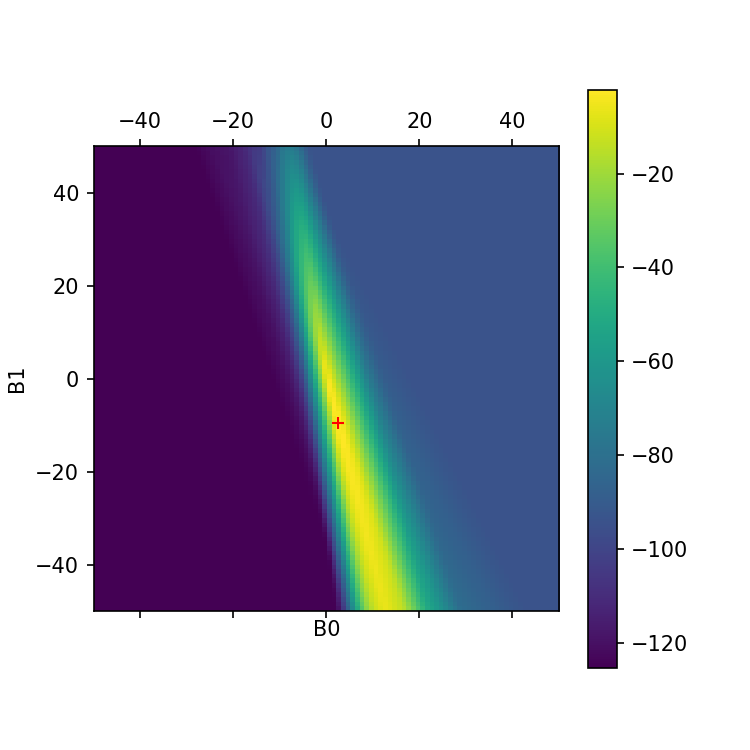

<IPython.core.display.Javascript object>


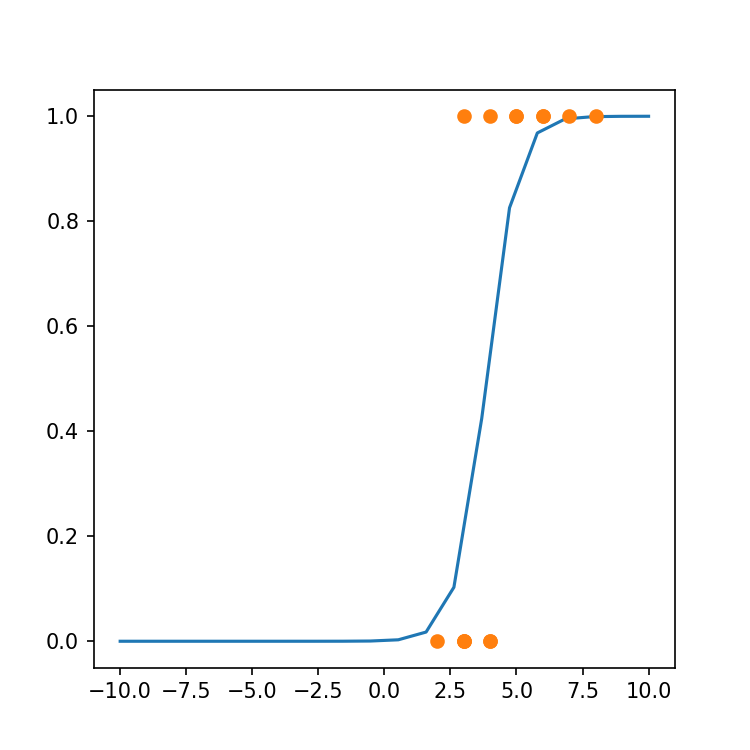

In [70]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
img = ax.matshow(L,extent=[np.min(params),np.max(params),np.min(params),np.max(params)],origin='lower')
yi,xi = np.unravel_index(np.argmax(L),L.shape)
ax.plot(params[xi],params[yi],'r+')
ax.set_xlabel('B0')
ax.set_ylabel('B1')
plt.colorbar(img,ax=ax)

w = params[xi],params[yi]
fig, ax = plt.subplots(1,1,figsize=(5,5))
ax.plot(x_axis[:,1],logistic(x_axis @ [a,b]))
ax.plot(x,y,'o')


<IPython.core.display.Javascript object>


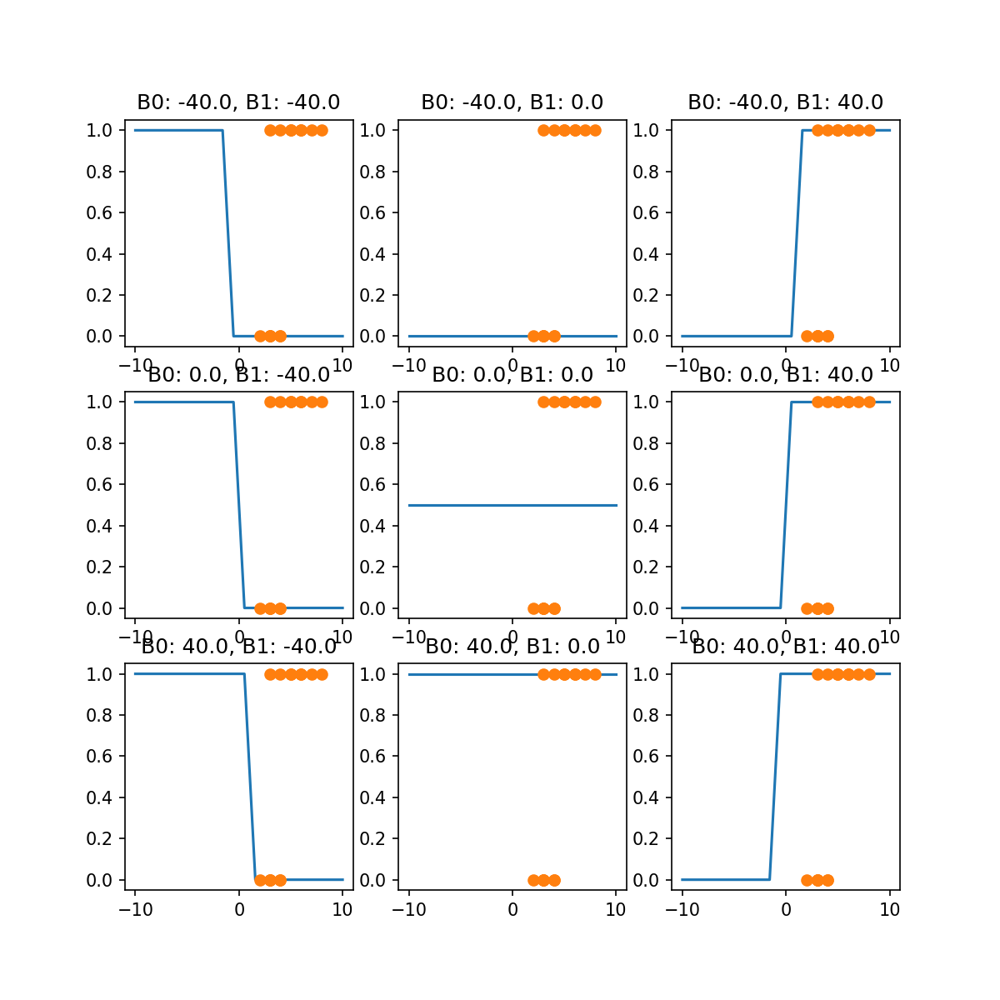

In [71]:
GS = 3 # grid size
fig,ax = plt.subplots(GS,GS,figsize=(8,8))
L = np.zeros((GS,GS))
params = np.linspace(-40,40,GS)
for i,B0 in enumerate(params):
    for j,B1 in enumerate(params):
        w = np.array([B0,B1])
        ax[i,j].plot(x_axis[:,1],logistic(x_axis @ w))
        ax[i,j].set_title(f"B0: {B0}, B1: {B1}")
        ax[i,j].plot(x,y,'o')


# 2D Sigmoid function

In [ ]:
def sigm2d(x,y):
    return 1. / (1. + np.exp(-x*0.2 + -y*0.41))
x = np.linspace(-2,2,10)
y = np.linspace(-2,2,10)
x,y = np.meshgrid(x,y)
z = sigm2d(x.reshape(-1),y.reshape(-1))
z = z.reshape(10,10)
plt.matshow(z)

# Optimization
https://www.youtube.com/watch?v=--NZb480zlg&list=PLLHTzKZzVU9eaEyErdV26ikyolxOsz6mq&index=8

## Gradient Descent: GD (full-batch)
"Gradient descent is the worst optimization method in the world."

$$ \min\limits_{w} f(w) $$

Follow the direction of local negative gradient with small steps.

$$ w_{k+1} = w_k - \gamma_k \triangledown f(w_k) $$

where $\gamma_k$ is step size, $\triangledown$ is the gradient of f and $w$ are a large collection of weights at the last and next iterations.

The gradient cuts entire half of the space.

Learning rate is an important parameter that will be decisive on how far you come close to true solution. 

Most of the time, training a network corresponds on adjusting the step-size that leads to best results:

- If the step-size is less than the optimal, convergence will take longer, progress will be steady. The trajectory will follow a path with small steps. 
- On the other hand, if it is larger, than it might make zig-zags (jumping from one hill to the other) leading also in convergence being slow. 
- When the step-size is much greater than the optimal, the solution can simply diverge away from the solution.
![Convergence](StepSize.png)
==> Practically, we will be having learning-rate that are slightly bigger than the optimal one, this will bring us to the convergence faster than the case where the learning rate is small. 
==> Almost always, we operate at the edge of divergence.
==> Practically, you try multiple ones on a log-scale and take the best one.
==> Learning rate can also be changed during learning.

## Stochastic Optimization: SGD (mini-batch)

"SGD is often the best optimization method available."

$$ \min\limits_{w} f(w) = \frac{1}{n}\sum_i^n{f_i(w)}$$
$$ f_i(w) = l(x_i,y_i,w) $$

Follow the direction of local negative gradient with small steps.

$$ w_{k+1} = w_k - \gamma_k \triangledown f_i(w_k) $$ where $i$ is chosen uniformly at random.

Practically, we use minibatches for SDG. 

Distributed training is also possible with SDG, where we distribute a large mini-batch to several computers. You can reduce training time from days to hours. (https://research.fb.com/wp-content/uploads/2017/06/imagenet1kin1h5.pdf)


### SDG has many benefits: 

SDG is actually a noisy version of GD. But this noise is actually beneficial as it prevents the convergence to be stuck at a bad local minimal ==> Annealing

Plain SDG (invented at 60s) with momentum (an innovation) is still the best method to train large networks.

### Momentum:

SGD + Momentum = Stochastic heavy ball method

Momentum parameter needs to be tuned as well.

$$ w_{k+1} = w_k - \gamma_k \triangledown f_i(w_k) + \beta_k(w_k-w_{k-1})$$

Beta of 0.9 or 0.99 works almost always well. However you have to change the step size to keep it constant across different beta values. Increase of beta => Decrease of step size. Actually scale it by 1/beta to keep the step-size balanced.

Momentum leads to smaller step size with learning.

The last term is the extra-term on top of SGD. The next step becomes a combination of the previous step's direction adn the new negative gradient.

In case you need full-batch optimization:
Practically you can use `torch.optim.LBFGS` or `scipy.optimize.fmin_l_bfgs_b`, the scipy is really bullet proof. This is better than GD.


<IPython.core.display.Javascript object>


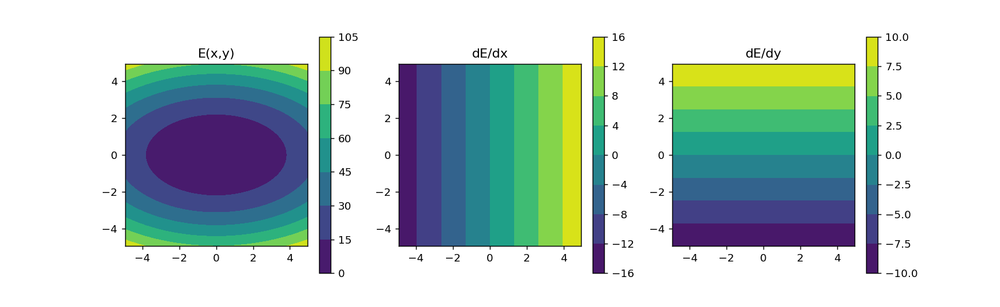

In [216]:
#Let's setup the error landsscape
def error(w1,w2):    
    return np.array([(x ** 2 + 3*y ** 2) for x,y in zip(w1,w2)])
def d_error_d_x(w1,w2):
    return np.array([(3*x ) for x,y in zip(w1,w2)])
def d_error_d_y(w1,w2):
    return np.array([(2*y ) for x,y in zip(w1,w2)])

size = 100
y,x = np.meshgrid(np.linspace(-5,5,size),np.linspace(-5,5,size))
L = error(y.reshape(-1),x.reshape(-1)).reshape((size,size))
dLdx   = d_error_d_x(y.reshape(-1),x.reshape(-1)).reshape((size,size))
dLdy   = d_error_d_y(y.reshape(-1),x.reshape(-1)).reshape((size,size))

f,a = fa(1,3,figsize=(13,4))
img = a[0].contourf(L,extent=[np.min(wx),np.max(wx),np.min(wy),np.max(wy)],origin='lower')
a[0].set_title('E(x,y)')
a[0].axis('square')
plt.colorbar(img,ax=a[0])

img    = a[1].contourf(dLdx,extent=[np.min(wx),np.max(wx),np.min(wy),np.max(wy)],origin='lower')
a[1].set_title('dE/dx')
a[1].axis('square')
plt.colorbar(img,ax=a[1])
#
img = a[2].contourf(dLdy,extent=[np.min(wx),np.max(wx),np.min(wy),np.max(wy)],origin='lower')
a[2].set_title('dE/dy')
a[2].axis('square')
plt.colorbar(img,ax=a[2])

<IPython.core.display.Javascript object>


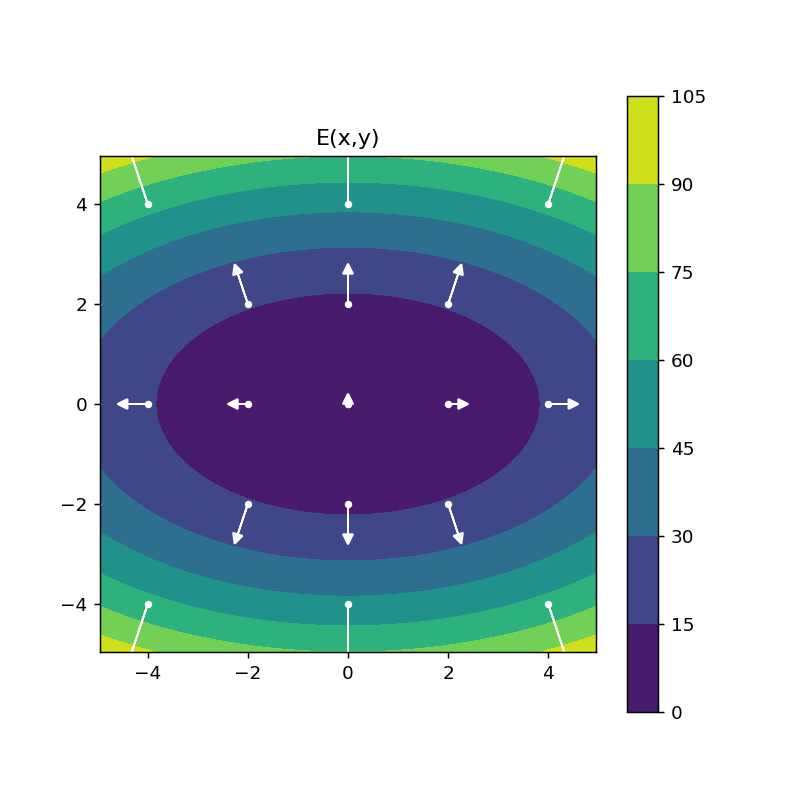

In [217]:
#Let's draw one step starting from position (x,y) as an arrow
c = (4,5)
def gradient(X):
    #computes gradient at position defined by vector X for x^2 + y^2
    return np.array([2*X[0],6*X[1]])
# At each point (x,y), we have 2 derivative functions and two variables. 
# The Jacobian will have the following form:
# df/dx, df/dy
# dg/dx, dg/dy, where the first column collects all equations that contributes to the x-dimension, 
# and second column all for the second dimension.
#
# 
def plot_me_gradient(coordinate,ax,scaler=10,GRADIENT=None,**kwargs):
    # you can directly pass the gradient, if not it is computed with the function above.
    ax.plot(coordinate[0],coordinate[1],'w.')
#     if the gradient is passed then don't compute it.
    if GRADIENT is None:
        V = gradient(coordinate)
    else:
        V = GRADIENT
    V = V/scaler
    ax.arrow(coordinate[0],
             coordinate[1],V[0],V[1],
             head_width=.2, 
             head_length=.2,
             **kwargs)
    
f,a = fa(1,1,figsize=(6,6))
img = a.contourf(L,extent=[np.min(wx),np.max(wx),np.min(wy),np.max(wy)],origin='lower')
a.set_title('E(x,y)')
a.axis('square')
plt.colorbar(img,ax=a)

for x,y in zip(np.array([-1,-1,-1,0,0,0,1,1,1,-2,-2,-2,0,0,0,2,2,2])*2,np.array([-1,0,1,-1,0,1,-1,0,1,-2,0,2,-2,0,2,-2,0,2])*2):
    plot_me_gradient(coordinate=[x,y],ax=a,scaler=20,color='w')

<IPython.core.display.Javascript object>


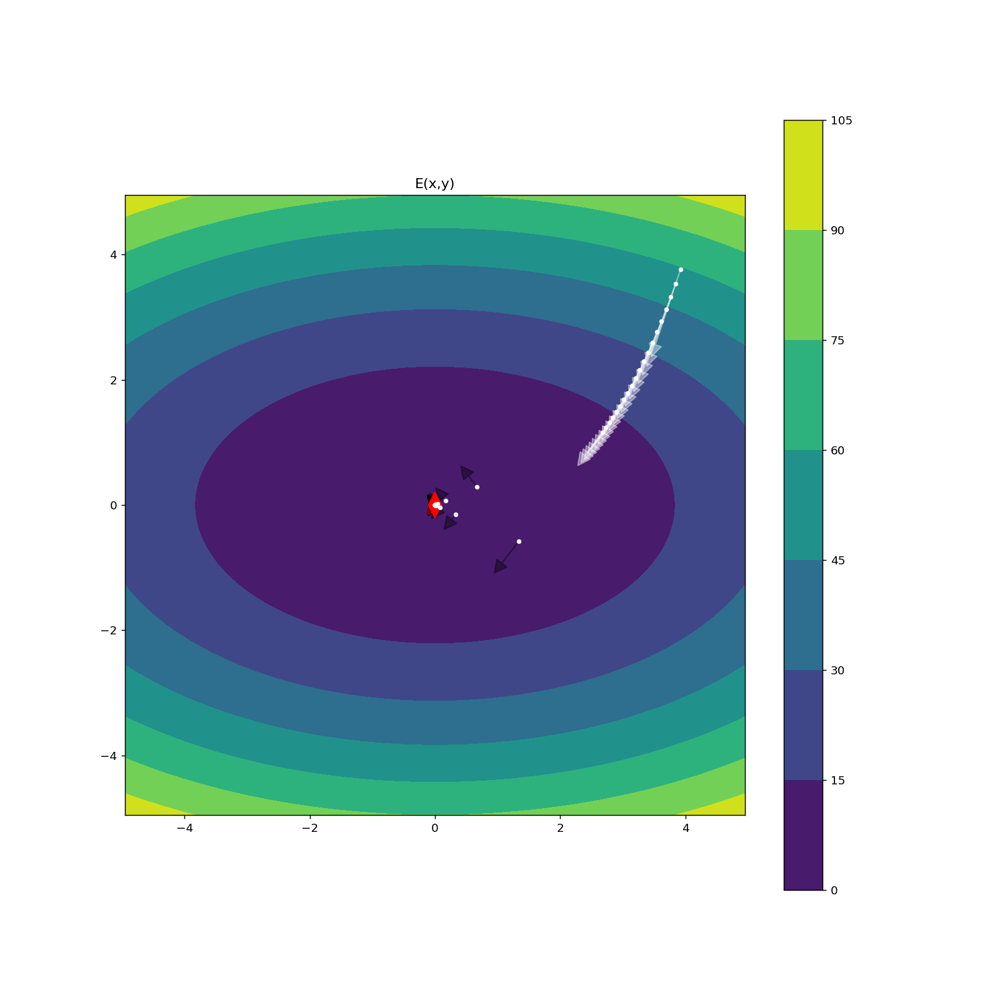

In [244]:
# now that we can compute gradients and plot them, we are all what we need to make one step along the steepest descent.
f,a = fa(1,1,figsize=(12,12))
img = a.contourf(L,extent=[np.min(wx),np.max(wx),np.min(wy),np.max(wy)],origin='lower')
a.set_title('E(x,y)')
a.axis('square')
plt.colorbar(img,ax=a)

coor_old        = np.array([4,4])

for color, gamma in zip(['w','k','r'],[0.01,0.25,.4]):
    iter = 0
    while iter < 20:
        iter += 1
        G = gradient(coor_old)
        coor_new = coor_old - gamma*G
        coor_old = coor_new

        plot_me_gradient(coordinate=coor_new,ax=a,scaler=20,GRADIENT=-G,color=color,alpha=.4)

## Adaptive Methods:

The idea is to have a weight-specific learning rate for each weight.